# Topic Modeling and Information Retrieval 


This activity focuses on the use of BERTopic for Topic Modeling (TM) and Information Retrieval (IR), offering a step-by-step Python implementation guide. Participants will learn about textual data preprocessing, document embedding generation, dimensionality reduction, and hierarchical clustering for latent topic detection. 


*Author: Giovanni Maria De Filippis
PhD student in Computational and Quantitative Biology (CQB)*

Colab url: *https://colab.research.google.com/github/johndef64/grpm_bertopic/blob/main/bertopic_tutorial.ipynb*
shorturl: <u>*https://shorturl.at/axDSX*</u>

# System Preparation

## Install requirements

In [1]:
import importlib
import subprocess
try:
    # Check if the module is already installed
    importlib.import_module('torch')
    print("torch is already installed.")
except ImportError:
    # If the module is not installed, try installing it
    subprocess.run(['pip3', 'install', 'torch', 'torchvision', 'torchaudio', '--index-url', 'https://download.pytorch.org/whl/cu118'])
    print("torch was installed correctly.")

import torch
print("Torch version:",torch.__version__)
print("Is CUDA enabled?",torch.cuda.is_available())
if torch.cuda.is_available():
    print(torch.randn(1).cuda())
else:
    #get torch here: https://pytorch.org/get-started/locally/
    subprocess.run(['pip3', 'uninstall', 'torch'])
    subprocess.run(['pip3', 'install', 'torch', 'torchvision', 'torchaudio', '--index-url', 'https://download.pytorch.org/whl/cu118'])
    
#n.b. Install "torch cu118" before installing "bertopic"

torch is already installed.
Torch version: 2.5.1
Is CUDA enabled? True
tensor([-0.5219], device='cuda:0')


In [ ]:
%%time
#install requirements
!pip install nltk  
!pip install spacy
!pip install gdown
!pip install pandas
!pip install seaborn
!pip install bertopic
!pip install wordcloud
!pip install matplotlib
!pip install scikit-learn
# !pip install bertopic[visualization]  #This has to be installed separately

## Import packages

In [1]:
###### Import packages ######
import os
import io
import sys
import ast
import re
import gdown
import random
import requests
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn.datasets as data_
from datetime import datetime

if not 'google.colab' in sys.modules:
    !pip install pyperclip
    import pyperclip as pc

# Plotly: Set notebook mode to work offline
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()

# Set data directory
data_path = 'data/'
if not os.path.exists(data_path):
    os.makedirs(data_path)


###### HTML display ######
from IPython.display import display, HTML

# HTML template for two side-by-side boxes
html_template = """
<div style="display: flex;">
    <div style="border: 1px solid black; padding: 10px; margin: 10px;">
        <h3>Original Text:</h3>
        <p>{}</p>
    </div>
    <div style="border: 1px solid black; padding: 10px; margin: 10px;">
        <h3>Processed Text:</h3>
        <p>{}</p>
    </div>
</div>
"""


###### Define simple functions ######

def get_gitfile(url, flag='', dir = os.getcwd()):
    url = url.replace('blob','raw')
    response = requests.get(url)
    file_name = flag + url.rsplit('/',1)[1]
    file_path = os.path.join(dir, file_name)
    if response.status_code == 200:
        with open(file_path, 'wb') as file:
            file.write(response.content)
        print(f"File downloaded successfully. Saved as {file_name}")
    else:
        print("Unable to download the file.")

# Text Classification and Topic Modeling: An Introduction

## Text Classification

Text classification is a foundational task in the field of Natural Language Processing (NLP) that involves categorizing text into predefined groups or classes. It is a method used to automatically assign pre-defined categories to text documents, making it easier to manage and sort through large volumes of data. The applications of text classification are vast and varied, here's a brief look into some of these applications:
1. **Spam Detection**: Automatically identifying and filtering out unwanted email messages, protecting users from spam.
2. **Sentiment Analysis**: Determining the sentiment behind a piece of text, helping businesses understand customer opinions and trends on social media platforms.
3. **News Categorization**: Automatically sorting news articles into predefined categories like sports, politics, and technology, improving the discoverability of content in news aggregation platforms.
4. **Topic Labeling**: Assigning topics or categories to text documents, facilitating easier navigation, and search within large databases (our use case).

At its core, text classification algorithms learn from a labeled dataset to understand the connection between the textual features and the output labels. These algorithms can range from traditional methods (simple *rule-based classifiers*) to complex *deep learning* models. In this context, we will only discuss the use of Pre-trained Language Models for text classification and topic modeling.

Reference: "A Survey on Text Classification", https://arxiv.org/pdf/2008.00364 

## Text Classification Using Embedding Vectors from Pre-trained Language Models

The advent of pre-trained language models (like BERT, GPT) has significantly enhanced the effectiveness of text classification. Models like BERT or GPT are trained on a large corpus of text data, enabling them to capture *context, syntax, and semantic meanings*. Here's how they are used for text classification with embedding vectors and cosine similarity:

### 1. Text Embeddings with Pre-trained Language Models

- **Generating Embeddings:** When we input a piece of text to these models, they encode it into a high-dimensional vector, known as an embedding. This vector captures the essence of the text based on the knowledge the model has acquired during its pre-training.
- **Vector Characteristics:** These vectors are dense, typically consisting of hundreds or thousands of dimensions, and each dimension contributes to encoding different aspects of the text's meaning.

### 2. Cosine Similarity for Classification

- **What is Cosine Similarity?** It's a measure used to calculate the cosine of the angle between two vectors in a multi-dimensional space. It ranges from -1 to 1, where 1 implies identical orientation, 0 indicates orthogonality, and -1 indicates opposite orientation.
- **Application in Classification:** For classifying a text, its embedding vector is compared to predefined category vectors (or centroids of existing classified text vectors) using cosine similarity. The category whose vector has the highest cosine similarity with the text's vector is chosen as the classification outcome.
- **Advantage:** This method leverages contextual embeddings from pre-trained models, which are rich in **semantic information**, making the classification more accurate even with less training data for specific tasks.


## Topic Modeling Using Pre-trained Language Models

Topic modeling is a machine learning technique used to uncover hidden thematic structures within a collection of documents. It helps in organizing, understanding, and summarizing large datasets of textual information. Traditional algorithms for topic modeling include *Latent Dirichlet Allocation* (LDA) and *Non-negative Matrix Factorization* (NMF). However, the rise of pre-trained language models has transformed the field by offering new context-aware approaches to discovering topics.

Using these pre-trained models for topic modeling involves leveraging their ability to understand context, semantics, and the *relationship between words*. Instead of just counting words or phrases, they can capture the underlying meanings and themes within the text. 

The workflow involves several steps:

1. **Text Embedding**: The documents are transformed into vector representations using the pre-trained model. Each document is converted into a high-dimensional space that captures semantic meanings.
2. **Dimensionality Reduction**: Techniques like PCA, t-SNE or UMAP can be applied to reduce dimensionality and cluster similar documents.
3. **Clustering**: The reduced embeddings are then clustered using algorithms like *K-means* or *Hierarchical Clustering*. Each cluster represents a potential topic.
4. **Interpretation**: The final step involves interpreting the clusters to identify the topics they represent. This can involve examining the most representative documents or terms for each cluster.


Let's perform a Topic Modeling workflow based on BERT Pre-trained Language Models on a large corpus of scientific article abstracts.

# BERTopic Introduction

BERTopic is a topic modeling technique that leverages 🤗 transformers and c-TF-IDF to create document dense clusters allowing for easily interpretable topics whilst keeping important words in the topic descriptions.  

BERT: *Bidirectional Encoder Representations from Transformers*, is a language model based on the transformer architecture. BERT is an "encoder-only" transformer architecture.  

https://huggingface.co/docs/transformers/model_doc/bert :: BERT text classification notebooks

**BERTopic - Read The Docs**
https://bertopic.readthedocs.io/en/latest/#

# Table of Contents

1. Documents Retrieval and Text Pre-processing
2. Quick Start: Default setting
3. Unfolding BERTopic blackbox
4. Assemble your custom BERTopic model
5. Topic Visualization
6. Topic Evaluation and Document Retrieval
7. Analyze Results
8. Extras

# 1. Documents Retrieval and Text Preprocessing

## Get Documents from Scopus 


**Define Reserach Context**

1. **Integrative Bioinformatics and System Biology Domain** 
This field involves the integration of biological data with computational analysis to understand complex biological systems at a holistic level. It combines biology, computer science, and statistics to gain insights into biological processes.

3. **Semantic Technologies and Information Retrieval Domain**
Semantic technologies focus on understanding and representing the meaning of data. Information retrieval involves the organized retrieval of relevant information from large collections of data based on user queries. This domain leverages semantics to enhance information retrieval processes.

**Scopus Search String Creation**
 
- Combine keywords related to bioinformatics, systems biology, computational analysis, biological data integration.
- Utilize Boolean operators (AND, OR, NOT) to refine search results.
- Incorporate specific terms like "network analysis," "gene expression," "biological pathways," "data integration."

- Include keywords related to semantic technologies, data meaning, information retrieval, user queries.
- Use specific terms such as "ontology," "semantic web," "natural language processing," "information extraction."
- Employ truncation (*) and wildcard (?) symbols for variations of terms.

In [78]:
# Scopus Search String Generator
def create_string(data_list):
    return '(' + ' OR '.join([f'"{item}"' for item in data_list]) + ')'

##########################################################

### Reaserch Domains ###

# List of general MeSH terms related to the biology of nutrition
nutrition_terms = [
    "Nutrition Physiology",
    "Dietary Fats",
    "Carbohydrate Metabolism",
    "Protein Metabolism",
    "Micronutrients",
    "Macronutrients",
    "Nutritional Requirements",
    "Nutritional Status",
    "Malnutrition",
    "Nutritional Sciences",
    "Vitamin Deficiency",
    "Dietary Proteins",
    "Bioavailability",
    "Caloric Restriction",
    "Nutritional Support",
    "Digestive System",
    "Metabolic Networks and Pathways",
    "Energy Metabolism",
    "Feeding Behavior",
    "Healthy Diet"
]
# List of terms related to genetics, genetic association studies, genomics, polymorphisms, and population genetics
genetics_terms = [
    #"Genomics",
    "Genetic Predisposition",
    "Polymorphism, Genetic",
    "Genetic Association Studies",
    "Population Genetics",
    "Heritability",
    "Penetrance",
    "Single Nucleotide Polymorphism",
    "SNP",
    "Genome-Wide Association Study",
    "GWAS",
    "Linkage Disequilibrium",
    "Allele Frequency",
    "Genetic Variants",
    "Mendelian Inheritance",
    "Haplotypes",
    "Genotype-Phenotype Correlation",
    "Functional Genomics",
    "Epigenetics",
    "Copy Number Variations",
    "Genomic Imprinting"
]


population = create_string(nutrition_terms)
intervention = create_string(genetics_terms)
picoc = [population, intervention]


# Exlude terms
excluded_term = []
excluded_term = create_string(excluded_term)

# to Scopus
center = ' AND '.join(picoc)
excluded = ' AND NOT '+ excluded_term
search_string = f'TITLE-ABS-KEY({center})'

### Exclusion Criteria ###
year=''' AND PUBYEAR > 2015 AND PUBYEAR < 2025 '''
area='''AND ( LIMIT-TO ( SUBJAREA , "BIOC" ))'''  #OR LIMIT-TO ( SUBJAREA , "COMP" ) #OR LIMIT-TO ( SUBJAREA , "MEDI" ) OR LIMIT-TO ( SUBJAREA , "PHAR" ) '''
language='''AND ( LIMIT-TO ( LANGUAGE,"English"))'''
doc_type = f'''AND  ( LIMIT-TO ( DOCTYPE,"ar" ) )'''

if len(excluded_term) > 0:
    search_string_ec = f'TITLE-ABS-KEY({center} {excluded}) {year} {area} {doc_type} {language}'
else:
    search_string_ec = f'TITLE-ABS-KEY({center} ) {year} {area} {doc_type} {language}'
    
#import pyperclip as pc
#pc.copy(search_string_ec)

print(search_string_ec)

TITLE-ABS-KEY(("Nutrition Physiology" OR "Dietary Fats" OR "Carbohydrate Metabolism" OR "Protein Metabolism" OR "Micronutrients" OR "Macronutrients" OR "Nutritional Requirements" OR "Nutritional Status" OR "Malnutrition" OR "Nutritional Sciences" OR "Vitamin Deficiency" OR "Dietary Proteins" OR "Bioavailability" OR "Caloric Restriction" OR "Nutritional Support" OR "Digestive System" OR "Metabolic Networks and Pathways" OR "Energy Metabolism" OR "Feeding Behavior" OR "Healthy Diet") AND ("Genetic Predisposition" OR "Polymorphism, Genetic" OR "Genetic Association Studies" OR "Population Genetics" OR "Heritability" OR "Penetrance" OR "Single Nucleotide Polymorphism" OR "SNP" OR "Genome-Wide Association Study" OR "GWAS" OR "Linkage Disequilibrium" OR "Allele Frequency" OR "Genetic Variants" OR "Mendelian Inheritance" OR "Haplotypes" OR "Genotype-Phenotype Correlation" OR "Functional Genomics" OR "Epigenetics" OR "Copy Number Variations" OR "Genomic Imprinting")  AND NOT ())  AND PUBYEAR > 

## Scopus Advanced Search

1. Use the **Search String** in Scopus advanced search engine: https://www.scopus.com/search/form.uri?display=advanced

2. Export Bibliographic data in CSV enabling title, abstract and keywords

In [2]:
file_path = os.path.join(data_path, 'scopus_trial.csv')

# Otherwise download pre-form CSV from GitHub
if not os.path.exists(file_path):
    url = 'https://raw.githubusercontent.com/johndef64/grpm_bertopic/main/data/scopus_trial.csv'
    gdown.download(url, file_path, quiet=False)
df_scopus = pd.read_csv(data_path+'scopus_trial.csv')
df_scopus#.head()

,Authors,Author full names,Author(s) ID,Title,Year,Source title,Volume,Issue,Art. No.,Page start,...,Link,Abstract,Author Keywords,Index Keywords,PubMed ID,Document Type,Publication Stage,Open Access,Source,EID
0,Aschenbrenner D.; Nassiri I.; Venkateswaran S....,"Aschenbrenner, Dominik (55177881900); Nassiri,...",55177881900; 25931080600; 57192164581; 5716949...,An isoform quantitative trait locus in SBNO2 l...,2024,Nature Communications,15,1,4529,NaN,...,https://www.scopus.com/inward/record.uri?eid=2...,Despite major advances in linking single genet...,NaN,Crohn Disease; DNA Methylation; Gene Expressio...,38806456.0,Article,Final,All Open Access; Gold Open Access; Green Open ...,Scopus,2-s2.0-85194894939
1,Burger N.F.V.; Nicolis V.F.; Botha A.-M.,"Burger, N. Francois V. (56195493000); Nicolis,...",56195493000; 57195730344; 7007035600,Host-specific co-evolution likely driven by di...,2024,BMC Genomics,25,1,153,NaN,...,https://www.scopus.com/inward/record.uri?eid=2...,Background: Russian wheat aphid (Diuraphis nox...,Buchnera aphidicola; Composite strains; Diurap...,Animals; Aphids; Buchnera; Diet; Escherichia c...,38326788.0,Article,Final,All Open Access; Gold Open Access; Green Open ...,Scopus,2-s2.0-85184706159
2,Sigalas P.P.; Shewry P.R.; Riche A.; Wingen L....,"Sigalas, Petros P. (57200546985); Shewry, Pete...",57200546985; 34573449300; 6701387766; 66023775...,Improving wheat grain composition for human he...,2024,Communications Biology,7,1,1001,NaN,...,https://www.scopus.com/inward/record.uri?eid=2...,Wheat is an important source of minerals for h...,NaN,"Chromosome Mapping; Chromosomes, Plant; Edible...",39147896.0,Article,Final,All Open Access; Gold Open Access; Green Open ...,Scopus,2-s2.0-85201433374
3,Duo H.; Chhabra R.; Muthusamy V.; Zunjare R.U....,"Duo, Hriipulou (57218649541); Chhabra, Rashmi ...",57218649541; 26029357600; 56439285100; 5654573...,"Assessing sequence variation, haplotype analys...",2024,Molecular Genetics and Genomics,299,1,7,NaN,...,https://www.scopus.com/inward/record.uri?eid=2...,Traditional maize grain is deficient in methio...,Essential amino acid; Genetic dissimilarity; I...,Amino Acids; Aspartic Acid; Haplotypes; Humans...,38349549.0,Article,Final,NaN,Scopus,2-s2.0-85185114621
4,Mounika V.; Deo C.; Shadap A.; Kisan N.P.; Sin...,"Mounika, Vadde (58033006200); Deo, Chandra (59...",58033006200; 59087076100; 57191022210; 5889235...,Unravelling genetic diversity and population s...,2024,Genetic Resources and Crop Evolution,71,8,NaN,4183,...,https://www.scopus.com/inward/record.uri?eid=2...,"Sweetpotato (Ipomoea batatas (L.) Lam), a vita...",Microsatellites; Molecular diversity; Populati...,genetic variation; genotype; germplasm; malnut...,NaN,Article,Final,NaN,Scopus,2-s2.0-85185248135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3286,Jung P.P.; Sigwalt A.; Ohnuki S.; de Montigny ...,"Jung, Paul P. (35310672900); Sigwalt, Anastasi...",35310672900; 57188865288; 16402421400; 6701653...,Large-scale survey of intraspecific fitness an...,2016,"G3: Genes, Genomes, Genetics",6,4,NaN,1063,...,https://www.scopus.com/inward/record.uri?eid=2...,It is now clear that the exploration of the ge...,Cell morphology; Fitness; Genetic diversity; P...,Cell Shape; Chromosome Mapping; Cluster Analys...,26888866.0,Article,Final,All Open Access; Gold Open Access; Green Open ...,Scopus,2-s2.0-84963976689
3287,Frąszczak M.; Suchocki T.; Szyda J.,"Frąszczak, Magdalena (55316979700); Suchocki, ...",55316979700; 35181993400; 55980331200,Utilization of information from gene networks ...,2016,Journal of Applied Genetics,57,1,NaN,129,...,https://www.scopus.com/inward/record.uri?eid=2...,Our study focused on quantifying functional si...,Cattle; Distance metric; Gene networks; Geneti...,Animals; Breeding; Cattle; Dairying; Dietary F...,26231234.0,Article,Final,All Open Access; Green Open Access; Hybrid Gol...,Scopus,2-s2.0-84956608165
3288,Kammel A.; Saussenthaler S.; Jähnert M.; Jonas.

In [3]:
#### Load Corpus
def load_corpus_from_csv(doc_name = 'scopus.csv', abs_col= 'Abstract'):    
    df = pd.read_csv(doc_name, index_col=0)
    df['paper_texts'] = df["Title"] + " [SEP] " + df["Abstract"] 
    docs = df['paper_texts'].drop_duplicates().to_list()
    
    print('\nEntry count:',len(df),
          '\nAbstract count:', df[abs_col].nunique(),
          '\nEntry without abstract:',len(df)-df.Abstract.nunique())

    return docs

docs_raw = load_corpus_from_csv(data_path+"scopus_trial.csv")
pd.Series(docs_raw).head()


Entry count: 3291 
Abstract count: 3273 
Entry without abstract: 18


0    An isoform quantitative trait locus in SBNO2 l...
1    Host-specific co-evolution likely driven by di...
2    Improving wheat grain composition for human he...
3    Assessing sequence variation, haplotype analys...
4    Unravelling genetic diversity and population s...
dtype: object

## Corpus preprocessing

### NLTK preprocessing* 
NLTK :: Natural Language Toolkit
1.  import *nltk* for stemming and stopword removal
2.  remove stopwords and stem the abstracts

**[ recommended using Default BERTopic settings, not needed using BERTopic Fine-Tuning Representations ]*

In [87]:
#download stopwords and the punkt tokenizer
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Utente\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Utente\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
%%time 
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize

stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

# lower text keeping acronyms uppercase
def conservative_lower(text):
    # Split the text into words
    words = text.split()
    
    # Lowercase the words that don't have consecutive uppercase letters
    processed_words = [word.lower() if not re.search('[A-Z]{2,}', word) else word for word in words]
    
    # Join the processed words back into text
    processed_text = ' '.join(processed_words)
    return processed_text


def text_preprocessing(text, stem = True, trim = True, conservative = False):
    word_tokens = word_tokenize(text)
    
    # 1. Lowercase
    if conservative:
        word_tokens = [conservative_lower(word) for word in word_tokens] 
    else:
        word_tokens = [word.lower() for word in word_tokens]

    # 2. Trimming: stop word removal
    if trim:
        word_tokens = [word for word in word_tokens if word not in stop_words] 
        
    # 3. Stemming (Lemmatization)
    if stem:
        word_tokens = [stemmer.stem(word) for word in word_tokens]
    return " ".join(word_tokens)


def nltk_preprocessing(docs_to_process, stem = False, trim= True, conservative=True):
    docs_preprocessed = [text_preprocessing(doc, stem, trim, conservative) for doc in docs_to_process]
    return docs_preprocessed
    
    
docs_to_process = docs_raw #docs.random.sample(docs_raw, 100)


###### Docs Preprocessing ######
docs_preprocessed = nltk_preprocessing(docs_to_process, stem = False, trim= True, conservative=True)

#n.b. (stem = False) stemming is not recommended using Pre-trained LM, it compromises the syntactic representation of the embedding
#################################

n = 1
data = {
    'original': docs_to_process[n],
    'processed': docs_preprocessed[n]
}

# Create the HTML content with the original and processed text
html_content = html_template.format(data['original'], data['processed'])
display(HTML(html_content))

print('document processed:', len(docs_preprocessed))

document processed: 3291
CPU times: total: 9.38 s
Wall time: 11.8 s


In [68]:
#!python -m spacy download en_core_web_sm
import spacy
nlp = spacy.load('en_core_web_sm')
print(f""" "helps" after lemmaztization :  spacy:{nlp("helps")[0].lemma_} ; nltk:{stemmer.stem("helps")}""")
print(f""" "helping" after lemmaztization :  spacy:{nlp("helping")[0].lemma_} ; nltk:{stemmer.stem("helping")}""")

 "helps" after lemmztization :  spacy:help ; nltk:help
 "helping" after lemmztization :  spacy:help ; nltk:help


# 2. Quick Start: Default setting

In [5]:
# Import the Method
from bertopic import BERTopic

# Results quick access
def get_topic_info(topic_model):
    df = topic_model.get_topic_info()
    df.drop('Representative_Docs', axis=1, inplace=True) 
    return df

def get_document_info(topic_model, docs):
    doc_info = topic_model.get_document_info(docs)
    return doc_info

## Applying to Processed Docs
Initially, we employ BERTopic as a **black box** tool for topic analysis.

In [85]:
%%time
# Create an instance of the BERTopic model
topic_model = BERTopic()

# Run BERTopic default pipline on preprocessed documents
topic_model_default = topic_model.fit(docs_preprocessed)

CPU times: total: 52 s
Wall time: 37.2 s


In [86]:
# Display detected topic info
get_topic_info(topic_model_default)

,Topic,Count,Name,Representation
0,-1,964,-1_sep_expression_genes_gene,"[sep, expression, genes, gene, study, associated, metabolism, patients, metabolic, mice]"
1,0,376,0_genes_grain_plant_wheat,"[genes, grain, plant, wheat, content, rice, identified, analysis, breeding, zn]"
2,1,240,1_cancer_tumor_cells_patients,"[cancer, tumor, cells, patients, cell, tumors, expression, metabolic, prognosis, survival]"
3,2,206,2_intake_diabetes_obesity_fat,"[intake, diabetes, obesity, fat, bmi, risk, allele, genetic, dietary, associated]"
4,3,134,3_cancer_risk_95_ci,"[cancer, risk, 95, ci, colorectal, digestive, crc, association, or, breast]"
5,4,108,4_milk_cows_traits_cattle,"[milk, cows, traits, cattle, feed, dairy, lactation, efficiency, genetic, rfi]"
6,5,81,5_methylation_dna_maternal_epigenetic,"[methylation, dna, maternal, epigenetic, pregnancy, development, folic, changes, early, exposure]"
7,6,59,6_fish_growth_genes_differentiation,"[fish, growth, genes, differentiation, species, temperature, genetic, snps, traits, variation]"
8,7,58,7_strains_strain_aureus_genome,"[strains, strain, aureus, genome, coli, genes, m1uk, resistance, bacteria, bacterium]"
9,8,47,8_ibd_colitis_inflammatory_uc,"[ibd, colitis, inflammatory, uc, disease, ulcerative, intestinal, cells, bowel, epithelial]"


## Applying to Raw Docs

In [87]:
%%time
# Create an instance of the BERTopic model
topic_model = BERTopic()

# Run BERTopic default pipline on unprocessed documents...
topic_model_default_raw = topic_model.fit(docs_raw)

# Display detected topic info
get_topic_info(topic_model_default_raw)

CPU times: total: 52.3 s
Wall time: 37.6 s


,Topic,Count,Name,Representation
0,-1,965,-1_and_of_the_in,"[and, of, the, in, to, with, that, for, we, is]"
1,0,330,0_and_the_of_for,"[and, the, of, for, in, genes, grain, were, to, content]"
2,1,224,1_with_and_the_obesity,"[with, and, the, obesity, intake, of, in, was, diabetes, to]"
3,2,205,2_patients_variants_with_the,"[patients, variants, with, the, of, in, clinical, variant, deficiency, and]"
4,3,103,3_milk_cows_traits_for,"[milk, cows, traits, for, cattle, feed, dairy, and, were, the]"
5,4,103,4_cancer_patients_tumor_and,"[cancer, patients, tumor, and, of, the, in, tumors, with, gastric]"
6,5,93,5_aging_age_methylation_epigenetic,"[aging, age, methylation, epigenetic, of, longevity, dna, the, in, to]"
7,6,91,6_strains_the_of_to,"[strains, the, of, to, and, coli, strain, in, that, genome]"
8,7,70,7_drosophila_of_to_in,"[drosophila, of, to, in, the, melanogaster, that, we, and, genes]"
9,8,68,8_obesity_mice_adipose_in,"[obesity, mice, adipose, in, brown, tissue, energy, and, bat, adipocytes]"


The differences in the representations of topics between the two models suggest variations in the handling of *stop words* and the emphasis on domain-specific terms but the number and semantic meaning for the topics detected is similar. The cluster detected are the same, differences are due to random seed.

Thus, for a proper topic representation employing the <u>BERTopic default algorithm</u>, it is recommended to preprocess text data before. 

Preprocessing is recommended but not essential using BERTopic unlike other topic model algorithms (like **LDA**) that work on a probabilistic statistical model to discover topics because BERTopic relies on <u>vector text embeddings</u> extracted with BERT language models to calculate documents similarity.  

LDA is a generative statistical model while BERTopic use an embedding approach. For comparison, LDA topics analysis can be performed with **gensim** python package. 
 
[Example Kaggle Notebook](https://www.kaggle.com/code/pranjalsoni17/topic-modelling-using-lda/notebook)


# 3. Unfolding BERTopic blackbox

Let's dive into the inner workings of BERTopic algorithm opening the black box step by step.

link: https://maartengr.github.io/BERTopic/algorithm/algorithm.html

BERTopic can be viewed as a sequence of steps to create its topic representations. The following steps are completely modular:

1. Embedding documents
2. Reducing dimensionality of embeddings
3. Clustering reduced embeddings into topics
4. Tokenization of topics
5. Weight tokens (c-TF-IDF)
6. Represent topics with one or multiple representations

## 1. Embedding Documents

BERTopic starts with transforming our input documents into numerical representations. 

Although there are many ways this can be achieved, BERTopic employs as default sentence-transformers with "all-MiniLM-L6-v2" as it is quite capable of capturing the semantic similarity between documents.

### BERT Pretrained Models
https://www.sbert.net/docs/pretrained_models.html


| Model Name           | Description                                       | Dimensions | Size  | Note                                                          |
|----------------------|--------------------------------------------------|------------|-------|---------------------------------------------------------------|
| all-mpnet-base-v2    | All-round model tuned for many use-cases. Trained on a large and diverse dataset of over 1 billion training pairs. | 768 | 420 MB | Designed as a general-purpose model, the all-mpnet-base-v2 model provides the best quality. |
| all-MiniLM-L12-v2    | All-round model tuned for many use-cases. Trained on a large and diverse dataset of over 1 billion training pairs. | 384 | 120 MB | While all-MiniLM-L6-v2 is 5 times faster and still offers good quality. |


**Biomedical Domain Specific Models**  

Selected table with **specific BER models optimised for *BERTopic***, considering:
1. **Embedding quality** (dense representations for clustering).
2. **Biomedical domain** (trained on PubMed/clinical text).
3. **Reasonable size** (≤1024D for efficiency).

| Model Name   | Why It Works for BERTopic?                                                                 | Dimensions | Recommended Use Case |  
|-------------|-------------------------------------------------------------------------------------------|------------|----------------------|  
| **PubMedBERT** | Pretrained on PubMed abstracts + full-text. Best for **general biomedical literature** (e.g., research papers, reviews). | 768 | ✅ Default choice for PubMed/PMC-based topic modeling. |  
| **BioBERT** | Biomedical-tuned BERT. Balanced performance for **both technical and clinical text**. | 768 | ✅ Use if data mixes research papers and clinical notes. |  
| **SciBERT** | Trained on broad scientific text (18% biomedical). Good for **multidisciplinary science**. | 768 | ✅ Best for datasets blending biomedicine + other sciences. |  
| **BlueBERT** | Pretrained on PubMed + MIMIC-III (clinical notes). Fits **clinical + research hybrid corpora**. | 768 | ✅ Ideal for EHR-linked research or medical literature. |  
| **SPECTER** | Citation-based embeddings. Captures **paper-level semantic similarity** (not word-level). | 768 | ⚠️ Use *only* for clustering papers by citations/references. |  



---


**Key Recommendations**  
1. **For pure biomedical literature** (e.g., PubMed/PMC papers):  
   - **PubMedBERT** (optimal balance of domain specificity and embedding quality).  

2. **For clinical + research text**:  
   - **BlueBERT** (if EHR data is included) or **BioBERT** (if more research-focused).  

3. **For cross-domain science**:  
   - **SciBERT** (if topics span biology, chemistry, etc.).  

4. **For citation networks**:  
   - **SPECTER** (but *not* for word/phrase-level topics).  


Note: Avoid *General BERT models* for domain specific analysis (e.g., `bert-base-uncased`)—lack domain relevance.  



### Sentence Transformers

SentenceTransformers is a Python framework for state-of-the-art sentence, text and image embeddings. 

Embedding model: "all-MiniLM-L6-v2"  (output: 384 vector)

https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2 

In [7]:
from sentence_transformers import SentenceTransformer

# Choose pre-trained language model for inference
embedding_model = SentenceTransformer("all-MiniLM-L6-v2") 

In [89]:
%%time
topic_model = BERTopic(embedding_model=embedding_model) 

topic_model =  topic_model.fit(docs_preprocessed)

get_topic_info(topic_model)

CPU times: total: 52.2 s
Wall time: 42.7 s


,Topic,Count,Name,Representation
0,-1,950,-1_expression_gene_sep_associated,"[expression, gene, sep, associated, genes, study, metabolism, levels, genetic, protein]"
1,0,375,0_genes_grain_plant_wheat,"[genes, grain, plant, wheat, content, rice, identified, zn, analysis, breeding]"
2,1,231,1_cancer_tumor_cell_cells,"[cancer, tumor, cell, cells, patients, tumors, expression, metabolic, prognosis, immune]"
3,2,212,2_intake_obesity_diabetes_fat,"[intake, obesity, diabetes, fat, bmi, risk, allele, dietary, associated, genetic]"
4,3,165,3_strains_strain_genome_metabolic,"[strains, strain, genome, metabolic, genes, coli, acid, metabolites, production, isolates]"
5,4,126,4_cancer_risk_95_ci,"[cancer, risk, 95, ci, digestive, crc, colorectal, or, association, cancers]"
6,5,59,5_fish_growth_temperature_genes,"[fish, growth, temperature, genes, species, differentiation, genetic, snps, traits, aquaculture]"
7,6,52,6_syndrome_patients_patient_pathogenic,"[syndrome, patients, patient, pathogenic, congenital, clinical, variants, anomalies, rare, mnx1]"
8,7,43,7_cardiac_mitochondrial_heart_cardiomyopathy,"[cardiac, mitochondrial, heart, cardiomyopathy, myocardial, failure, hf, hcm, hypertrophy, cardiomyocyte]"
9,8,41,8_brown_adipose_mice_obesity,"[brown, adipose, mice, obesity, adipocytes, hfd, fat, tissue, bat, adipocyte]"


### Use Custom embeddings

In [93]:
%%time
# Generate embeddings ("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(docs_preprocessed, show_progress_bar=True)  # -> pre-processed docs
embeddings_raw = embedding_model.encode(docs_raw, show_progress_bar=True)          # -> un-processed docs

Batches:   0%|          | 0/103 [00:00<?, ?it/s]

Batches:   0%|          | 0/103 [00:00<?, ?it/s]

CPU times: total: 1min 2s
Wall time: 50.4 s


In [9]:
import pickle

def save_embeddings(filename='embeddings.pkl', embeddings=None): # p.e. to Vector DB ...
    if embeddings is None:
        raise ValueError("Embeddings must be provided.")
    #np.savetxt(data_path+filename, embeddings)
    with open(os.path.join(data_path, filename), 'wb') as f:
        pickle.dump(embeddings, f)

def load_embeddings(filename='embeddings.pkl'):
    #embeddings = np.loadtxt(data_path + filename)
    with open(os.path.join(data_path, filename), 'rb') as f:
        embeddings = pickle.load(f)
    return embeddings

In [ ]:
save_embeddings('embeddings.pkl', embeddings)
save_embeddings('embeddings_raw.pkl', embeddings_raw)

In [ ]:
# For this tutorial you can download premade embeddings
get_gitfile("https://github.com/johndef64/grpm_bertopic/raw/refs/heads/main/data/embeddings.pkl")
get_gitfile("https://github.com/johndef64/grpm_bertopic/raw/refs/heads/main/data/embeddings_raw.pkl")

In [94]:
embeddings = load_embeddings('embeddings.pkl')
embeddings_raw = load_embeddings('embeddings_raw.pkl')

print('type',type(embeddings))
embeddings[:5]

type <class 'numpy.ndarray'>


array([[ 0.01576555, -0.12564299,  0.03989071, ...,  0.011832  ,
         0.04382282, -0.0743053 ],
       [-0.10777672, -0.09101573, -0.04270694, ..., -0.02058939,
         0.04294064, -0.00530131],
       [-0.10809925,  0.01836606,  0.02043778, ..., -0.00625996,
         0.00848644, -0.07632697],
       [-0.08207121, -0.00407131, -0.03009218, ...,  0.05810278,
         0.01186575, -0.01131706],
       [ 0.02284739,  0.03233828, -0.09283998, ..., -0.0558564 ,
        -0.05231036, -0.05704886]], dtype=float32)

Splitting the embedding generation allows them to be reused several times for other processes...

In [95]:
%%time
# embeddings = load_embeddings('embeddings.pkl')
topic_model = BERTopic(embedding_model = embedding_model)

topic_model_precessed = topic_model.fit(docs_preprocessed, embeddings=embeddings)

get_topic_info(topic_model_precessed)

CPU times: total: 24.9 s
Wall time: 19.5 s


,Topic,Count,Name,Representation
0,-1,1012,-1_genes_sep_expression_gene,"[genes, sep, expression, gene, associated, study, metabolic, genetic, metabolism, levels]"
1,0,370,0_genes_grain_plant_wheat,"[genes, grain, plant, wheat, rice, content, identified, zn, analysis, breeding]"
2,1,234,1_cancer_tumor_cell_cells,"[cancer, tumor, cell, cells, patients, tumors, expression, metabolic, survival, prognosis]"
3,2,187,2_intake_diabetes_fat_obesity,"[intake, diabetes, fat, obesity, bmi, risk, allele, dietary, genetic, association]"
4,3,126,3_cancer_risk_95_ci,"[cancer, risk, 95, ci, crc, digestive, colorectal, or, association, breast]"
5,4,95,4_aging_age_longevity_lifespan,"[aging, age, longevity, lifespan, epigenetic, methylation, dna, restriction, ageing, senescence]"
6,5,87,5_deficiency_patients_variants_variant,"[deficiency, patients, variants, variant, mutations, mma, clinical, pathogenic, novel, patient]"
7,6,61,6_strains_strain_genome_aureus,"[strains, strain, genome, aureus, genes, aeruginosa, bacterial, coli, resistance, biofilm]"
8,7,58,7_fish_growth_temperature_genes,"[fish, growth, temperature, genes, species, differentiation, genetic, snps, traits, variation]"
9,8,50,8_syndrome_patient_patients_pathogenic,"[syndrome, patient, patients, pathogenic, variants, clinical, congenital, rare, anomalies, mnx1]"


In [17]:
%%time
# embeddings_raw = load_embeddings('embeddings_raw.txt')
topic_model = BERTopic(embedding_model = embedding_model)

topic_model_raw = topic_model.fit(docs_raw, embeddings=embeddings_raw)

get_topic_info(topic_model_raw)

CPU times: total: 22.7 s
Wall time: 6.49 s


,Topic,Count,Name,Representation
0,-1,1753,-1_of_the_and_in,"[of, the, and, in, to, that, with, for, is, by]"
1,0,644,0_and_in_the_genes,"[and, in, the, genes, of, were, plant, for, to..."
2,1,291,1_traits_feed_milk_cows,"[traits, feed, milk, cows, and, cattle, were, ..."
3,2,262,2_metabolic_data_network_networks,"[metabolic, data, network, networks, to, for, ..."
4,3,234,3_obesity_with_intake_fat,"[obesity, with, intake, fat, diabetes, risk, b..."
...,...,...,...,...
75,74,11,74_ovarian_cancer_psmd8_oc,"[ovarian, cancer, psmd8, oc, prognostic, osc, ..."
76,75,10,75_pten_ubiquitin_4443_mycn,"[pten, ubiquitin, 4443, mycn, trim14, neurobla..."
77,76,10,76_traumatic_brain_mtbi_rmtbi,"[traumatic, brain, mtbi, rmtbi, ptsd, npy, t4,..."
78,77,10,77_plant_strains_bacillus_phosphate,"[plant, strains, bacillus, phosphate, d103, an..."


Try to use a larger embedding model:

- "all-mpnet-base-v2"  (output: 768 vector)  General BERT model
- "dmis-lab/biobert-v1.1"  (output: 768 vector)  Domain specific
- "microsoft/BiomedNLP-BiomedBERT-base-uncased-abstract-fulltext" 

In [13]:
# Some Hugging face models, like BioBERT, needs authentication token

from huggingface_hub import login
# Use the 'login' method to authenticate with your Hugging Face access token.
# Replace 'your_token_here' with your actual token found in your Hugging Face account settings.
login('your_token_here')

In [14]:
# Define different models

small_model = SentenceTransformer("all-MiniLM-L6-v2") 
large_model = SentenceTransformer("all-mpnet-base-v2") 
biobert_model = SentenceTransformer("dmis-lab/biobert-v1.1")

No sentence-transformers model found with name dmis-lab/biobert-v1.1. Creating a new one with mean pooling.


In [98]:
%%time
# Choose embedding model

embeddings_large = large_model.encode(docs_preprocessed, show_progress_bar=True)
save_embeddings('embeddings_large.pkl', embeddings_large)

print('type',type(embeddings_large))
embeddings_large[:5]

Batches:   0%|          | 0/103 [00:00<?, ?it/s]

type <class 'numpy.ndarray'>
CPU times: total: 6min 49s
Wall time: 5min 50s


array([[-0.03849849, -0.00262603, -0.01269792, ..., -0.01289363,
        -0.03375694, -0.07023372],
       [-0.03227752, -0.04874311,  0.00940756, ...,  0.01170599,
        -0.00752101, -0.04682061],
       [-0.01812493, -0.06772529, -0.0076043 , ...,  0.05809682,
        -0.0160439 ,  0.00012723],
       [-0.05788284, -0.01839911, -0.0115444 , ..., -0.00228157,
        -0.01056571, -0.03218185],
       [-0.03384679, -0.01349408, -0.05300411, ...,  0.00612383,
         0.0279406 ,  0.00447812]], dtype=float32)

In [10]:
# embeddings_raw_large = large_model.encode(docs_raw, show_progress_bar=True)
# save_embeddings('embeddings_raw_large.pkl', embeddings_raw_large)

In [ ]:
# For this tutorial you can download premade embeddings
get_gitfile("https://github.com/johndef64/grpm_bertopic/raw/refs/heads/main/data/embeddings_large.pkl")
get_gitfile("https://github.com/johndef64/grpm_bertopic/raw/refs/heads/main/data/embeddings_raw_large.pkl")

In [99]:
topic_model = BERTopic(embedding_model = large_model)
topic_model = topic_model.fit(docs_preprocessed, embeddings=embeddings_large)

get_topic_info(topic_model)

,Topic,Count,Name,Representation
0,-1,975,-1_associated_risk_genes_study,"[associated, risk, genes, study, sep, gene, genetic, expression, metabolism, association]"
1,0,222,0_cancer_tumor_cells_cell,"[cancer, tumor, cells, cell, expression, tumors, metabolic, prognosis, survival, immune]"
2,1,141,1_plant_genes_drought_stress,"[plant, genes, drought, stress, analysis, expression, leaf, plants, tolerance, transcriptome]"
3,2,140,2_patients_variants_deficiency_clinical,"[patients, variants, deficiency, clinical, syndrome, variant, patient, phenotype, pathogenic, mutations]"
4,3,136,3_strains_strain_coli_genome,"[strains, strain, coli, genome, isolates, genes, acid, production, resistance, yeast]"
5,4,103,4_aging_age_longevity_lifespan,"[aging, age, longevity, lifespan, epigenetic, methylation, dna, old, related, restriction]"
6,5,84,5_seed_content_bean_breeding,"[seed, content, bean, breeding, fe, traits, zn, yield, markers, grain]"
7,6,66,6_compounds_inhibitors_docking_targets,"[compounds, inhibitors, docking, targets, compound, drug, inhibitor, potent, binding, active]"
8,7,65,7_fish_growth_species_genes,"[fish, growth, species, genes, differentiation, genetic, variation, population, temperature, snps]"
9,8,60,8_metabolites_network_data_oa,"[metabolites, network, data, oa, metabolic, pathways, pathway, gene, disease, networks]"


In [96]:
%%time
# Biological embedding model

embeddings_bio = biobert_model.encode(docs_preprocessed, show_progress_bar=True)
save_embeddings('embeddings_biobert.pkl', embeddings_bio)

print('type',type(embeddings_bio))
embeddings_bio[:5]

No sentence-transformers model found with name dmis-lab/biobert-v1.1. Creating a new one with mean pooling.


Batches:   0%|          | 0/103 [00:00<?, ?it/s]

type <class 'numpy.ndarray'>
CPU times: total: 5min 38s
Wall time: 5min 34s


array([[ 0.25481543, -0.02930569, -0.24804842, ...,  0.08709381,
         0.16361926,  0.13484329],
       [ 0.20380029, -0.18213257, -0.22402744, ...,  0.28867933,
        -0.00992985,  0.01640721],
       [ 0.15575   , -0.10723849, -0.18416476, ...,  0.18193698,
         0.15960968,  0.21564612],
       [ 0.10306412, -0.16067898, -0.2454176 , ...,  0.24958774,
         0.11234797,  0.09646663],
       [-0.02397229, -0.2769749 , -0.1011079 , ...,  0.32876194,
         0.1650337 , -0.00963999]], dtype=float32)

In [48]:
embeddings_bio = load_embeddings('embeddings_biobert.pkl')

In [97]:
%%time
#embeddings_bio = load_embeddings('embeddings_bio.txt')
topic_model = BERTopic(embedding_model = biobert_model)
topic_model = topic_model.fit(docs_preprocessed, embeddings=embeddings_bio)

get_topic_info(topic_model)

CPU times: total: 26.2 s
Wall time: 16.3 s


,Topic,Count,Name,Representation
0,-1,1188,-1_genes_gene_associated_study,"[genes, gene, associated, study, sep, expression, metabolism, genetic, analysis, levels]"
1,0,332,0_species_genome_genes_strains,"[species, genome, genes, strains, host, genetic, sep, strain, variation, gene]"
2,1,247,1_patients_variants_variant_mutations,"[patients, variants, variant, mutations, clinical, patient, pathogenic, deficiency, mutation, syndrome]"
3,2,133,2_cancer_tumor_genes_prognostic,"[cancer, tumor, genes, prognostic, expression, cell, immune, prognosis, tumors, analysis]"
4,3,120,3_genetic_risk_disease_causal,"[genetic, risk, disease, causal, mr, wide, association, associations, loci, diseases]"
5,4,120,4_epigenetic_review_aging_obesity,"[epigenetic, review, aging, obesity, health, metabolic, cancer, mechanisms, diseases, sep]"
6,5,97,5_mice_cells_induced_expression,"[mice, cells, induced, expression, endothelial, cell, no, mediated, role, tumor]"
7,6,83,6_offspring_methylation_epigenetic_dna,"[offspring, methylation, epigenetic, dna, diet, mice, maternal, changes, expression, rats]"
8,7,79,7_mice_obesity_glucose_adipose,"[mice, obesity, glucose, adipose, insulin, energy, fat, brown, bat, homeostasis]"
9,8,78,8_histone_chromatin_stem_cells,"[histone, chromatin, stem, cells, cell, metabolic, transcriptional, transcription, epigenetic, show]"


Outliers reduction: \
https://maartengr.github.io/BERTopic/getting_started/outlier_reduction/outlier_reduction.html#exploration 

In [66]:
# Reduce outliers
topics, probs = topic_model.fit_transform(docs_preprocessed, embeddings=embeddings_bio)
new_topics = topic_model.reduce_outliers(docs_preprocessed, topics)
topic_model.update_topics(docs_raw, topics=new_topics)
get_topic_info(topic_model)

2025-04-09 18:09:06,137 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


,Topic,Count,Name,Representation
0,0,319,0_patients_variants_with_mutations,"[patients, variants, with, mutations, variant, of, patient, in, the, clinical]"
1,1,324,1_metabolic_data_to_for,"[metabolic, data, to, for, the, network, of, models, networks, we]"
2,2,201,2_grain_zn_wheat_for,"[grain, zn, wheat, for, rice, traits, content, breeding, fe, and]"
3,3,168,3_compounds_inhibitors_docking_binding,"[compounds, inhibitors, docking, binding, drug, the, of, as, and, compound]"
4,4,230,4_gut_microbiota_microbial_microbiome,"[gut, microbiota, microbial, microbiome, the, intestinal, and, bacterial, in, of]"
...,...,...,...,...
62,62,11,62_silk_phosphorylation_phosphoproteins_phosphorylated,"[silk, phosphorylation, phosphoproteins, phosphorylated, proteins, phosphoproteomic, tbs, phosphoproteome, phosphopeptides, glycoproteins]"
63,63,23,63_gastric_gc_cancer_proliferation,"[gastric, gc, cancer, proliferation, 4ebp1, hnscc, expression, cell, invasion, macc1]"
64,64,13,64_gut_microbiota_depression_il,"[gut, microbiota, depression, il, mice, induced, inulin, dysbiosis, hfd, appetite]"
65,65,20,65_selection_breeds_chicken_cattle,"[selection, breeds, chicken, cattle, pig, chickens, pigs, breed, signatures, black]"


### 🤗 Hugging Face Transformers

it is possible to use transformers.pipelines as an alternative to sentence-transformers for generating sentence embeddings.

In [ ]:
%%time
from transformers.pipelines import pipeline
embedding_model = pipeline("feature-extraction", model="distilbert-base-cased")

topic_model = BERTopic(embedding_model=embedding_model)
topic_model_distil = topic_model.fit(docs_preprocessed)

get_topic_info(topic_model_distil)

## 2. Dimensionality Reduction

As a default, BERTopic uses **UMAP algorithm** to perform its dimensionality reduction. 

*Uniform Manifold Approximation and Projection for Dimension Reduction* (UMAP)
In general, UMAP is based on a hypothesis called the <u>manifold hypothesis</u>, which holds that high-dimensionality data actually lie on varieties (manifolds)
of lower dimensionality. This means that although we have high dimensionality data, there are some representations of them in smaller dimensions.

UMAP Docs : https://umap-learn.readthedocs.io/en/latest/basic_usage.html
            https://umap-learn.readthedocs.io/en/latest/parameters.html
            

In [20]:
from umap import UMAP
import numpy as np
import pandas as pd

# Initialize UMAP model with specified parameters
umap_model = UMAP(n_neighbors  = 15,
                  n_components = 5,
                  min_dist     = 0.0,
                  metric       = 'cosine',
                  random_state = 123456  # seed: ensures reproducibility
                  )

# Plot the bidimensional data
def plot_umap(reduced_data, size = (8, 6)):
    plt.figure(figsize=size)
    plt.scatter(reduced_data[:, 0], reduced_data[:, 1])
    plt.title('Bidimensional Representation of Data via UMAP')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.show()

We need to train our reducer, letting it learn about the manifold. 

For this UMAP has a method <u>*fit*</u> which we pass the data we want the model to learn from. Since, at the end of the day, we are going to use the reduced representation of the data, we will use, instead, the <u>*fit_transform*</u> method which first calls fit and then returns the transformed data as a numpy array.

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.710711,0.885542,0.869659,0.352113,0.434987,0.669162,0.811978,0.252722,0.066922,0.591090,0.745852,0.968407,0.106421,0.365127,0.821282
1,0.555557,0.859028,0.753480,0.933641,0.643247,0.586415,0.338703,0.569595,0.136341,0.017437,0.379445,0.046126,0.298812,0.484074,0.650238
2,0.042999,0.977075,0.940948,0.299925,0.055922,0.884628,0.830925,0.805235,0.061395,0.253722,0.040819,0.363911,0.825539,0.030600,0.244238
3,0.819080,0.210666,0.684723,0.255595,0.877157,0.869953,0.814803,0.858631,0.973372,0.280990,0.067447,0.842237,0.914438,0.326453,0.955025
4,0.600598,0.659406,0.047753,0.690539,0.245680,0.988561,0.408614,0.632687,0.471681,0.860267,0.141813,0.905961,0.980241,0.160689,0.151982


,0,1,2,3,4
0,11.189585,3.262275,5.007365,5.763516,-1.414876
1,11.170156,3.903916,4.340127,6.889196,-0.723674
2,9.459059,2.891212,5.647563,6.124855,-1.948772
3,9.421803,3.404142,5.870643,6.065570,-1.676855
4,9.860521,3.446604,6.012456,6.019148,-1.999199


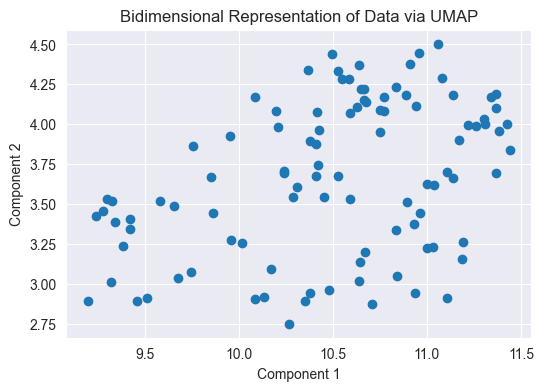

CPU times: total: 2.48 s
Wall time: 2.59 s


In [66]:
%%time
# Create dummy data: 100 samples with 15 features each
data = np.random.rand(100, 15)

# Fit the model to the data and transform it
reduced_data = umap_model.fit_transform(data)


# Data now contains the n-dimensional representation of the input data
display(pd.DataFrame(data)[:5])
display(pd.DataFrame(reduced_data)[:5])

plot_umap(reduced_data, (6,4))

UMAP parameters:

| Parameter      | Description                                                                                          |
|----------------|------------------------------------------------------------------------------------------------------|
| n_neighbors    | Controls the balance between local and global structure in the data for UMAP algorithm.                |
| min_dist       | Controls how closely UMAP is allowed to pack data points together in the low dimensional representation.|
| n_components   | Determines the dimensionality of the reduced dimension space for embedding the data in UMAP algorithm. |


          0         1         2         3
0  0.681374  0.390084  0.138667  0.012264
1  0.198098  0.633591  0.605191  0.066444
2  0.531235  0.246767  0.661402  0.308060
3  0.625904  0.551714  0.989739  0.938810
4  0.198964  0.280384  0.624622  0.522180


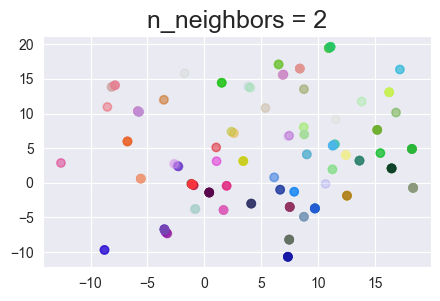

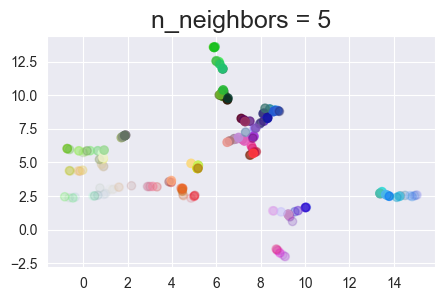

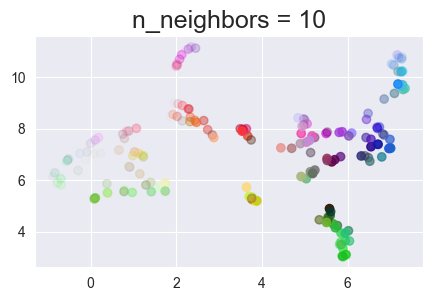

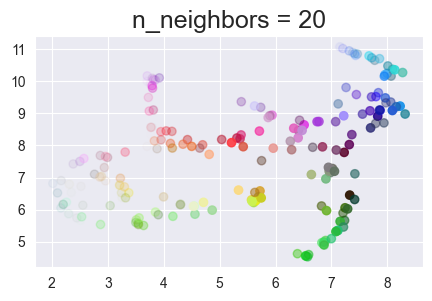

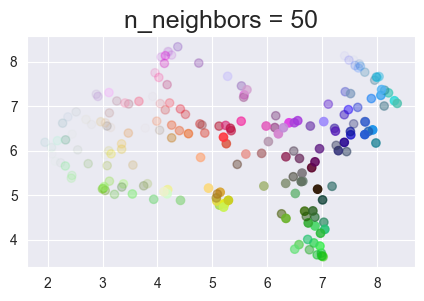

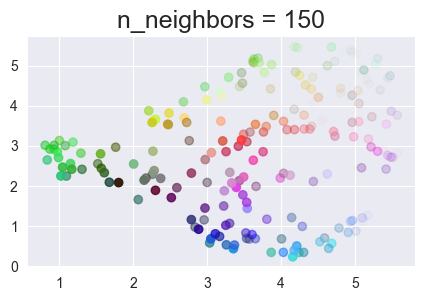

In [67]:
def apply_umap_plot(data, n_neighbors=15, min_dist=0.0, n_components=2, metric='cosine', title=''):
    fit = UMAP(n_neighbors  = n_neighbors,
               n_components = n_components,
               min_dist     = min_dist,
               metric       = metric,
               random_state = 123456)
      
    u = fit.fit_transform(data)
    
    fig = plt.figure(figsize=(5, 3))
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=data)
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=data)
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=data, s=100)

    plt.title(title, fontsize=18)
    plt.show()
    return u

# trial with random data
data = data
data = np.random.rand(200, 4)  
#data = embeddings[:,0:4]
#data = np.abs(embeddings[:, 0:4])
print(pd.DataFrame(data).head())

# test different n_neighbors:
for n in (2, 5, 10, 20, 50, 150):
    u = apply_umap_plot(data, n_neighbors=n, n_components=2, title='n_neighbors = {}'.format(n))

Understanding UMAP : https://pair-code.github.io/understanding-umap/ \
Andy Coenen, Adam Pearce | Google PAIR

Applying UMAP to our text embeddings

In [100]:
embeddings = load_embeddings("embeddings_large.pkl")

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.038498,-0.002626,-0.012698,-0.003317,-0.017779,-0.018378,0.046135,0.010866,0.024244,0.003188,...,-0.006956,0.051586,-0.086883,0.057721,-0.015372,-0.023937,0.023654,-0.012894,-0.033757,-0.070234
1,-0.032278,-0.048743,0.009408,-0.020033,-0.037084,0.008403,0.043637,-0.035363,0.067812,-0.024567,...,-0.007503,0.000399,0.017923,0.005793,0.028013,-0.086548,0.048637,0.011706,-0.007521,-0.046821
2,-0.018125,-0.067725,-0.007604,0.076696,0.042773,0.002626,-0.069853,0.006795,0.054460,0.009511,...,0.006423,0.035179,-0.061056,0.017392,0.060183,-0.059500,0.046471,0.058097,-0.016044,0.000127
3,-0.057883,-0.018399,-0.011544,0.037330,0.030850,0.019388,-0.021380,0.053441,0.039323,-0.071608,...,0.034715,0.045632,-0.048696,0.004560,0.025582,0.000009,0.008651,-0.002282,-0.010566,-0.032182
4,-0.033847,-0.013494,-0.053004,0.044648,0.012672,0.012984,0.004648,0.026036,0.037570,0.032873,...,0.020293,0.005332,-0.014485,-0.010945,0.021946,-0.033438,0.005223,0.006124,0.027941,0.004478


,0,1,2,3,4
0,9.242762,7.123068,9.025348,6.525757,3.149766
1,4.965251,6.067622,7.110082,6.083025,1.972532
2,2.306515,6.230937,4.838864,5.268165,3.112025
3,2.285790,6.350803,5.310606,5.161714,2.661467
4,2.107511,6.219526,5.288341,5.090033,2.687271


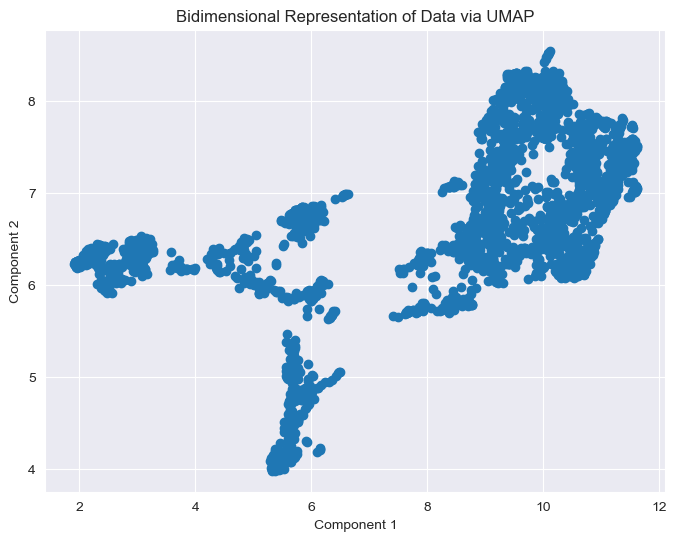

CPU times: total: 25.9 s
Wall time: 29.5 s


In [101]:
%%time
from umap import UMAP
umap_model = UMAP(n_neighbors  = 15,
                  n_components = 5,
                  min_dist     = 0.0,
                  metric       = 'cosine',
                  random_state = 123456  # seed: ensures reproducibility
                  )
# Use our text embeddings
reduced_embeddings = umap_model.fit_transform(embeddings)

# Embeddings now contains the n-dimensional representation of the input data
display(pd.DataFrame(embeddings)[:5])
display(pd.DataFrame(reduced_embeddings)[:5])

plot_umap(reduced_embeddings)

### Apply to BERTopic model

To use a UMAP model with custom parameters, we simply define it and pass it to BERTopic.            

In [103]:
embeddings = load_embeddings("embeddings_large.pkl")
embedding_model = SentenceTransformer("all-mpnet-base-v2")

In [104]:
%%time 

# Step 2 - Reduce dimensionality
from umap import UMAP

# Using uniform manifold approximation and projection (UMAP) to reduce the dimension of embeddings
umap_model = UMAP(n_neighbors  = 15, # 15 default
                  n_components = 5,  # 5 default
                  min_dist     = 0.0,
                  metric       = 'cosine',
                  random_state = 123456) # default:None --> ensures reproducibility

topic_model = BERTopic(umap_model = umap_model,  # <--
                       embedding_model = embedding_model)

topic_model_umap = topic_model.fit(docs_preprocessed, embeddings=embeddings)  # recycling previously generated embeddings

get_topic_info(topic_model_umap)

CPU times: total: 26 s
Wall time: 26.8 s


,Topic,Count,Name,Representation
0,-1,832,-1_associated_sep_expression_gene,"[associated, sep, expression, gene, genes, study, patients, risk, levels, disease]"
1,0,235,0_obesity_intake_risk_diabetes,"[obesity, intake, risk, diabetes, bmi, fat, leptin, body, associated, weight]"
2,1,220,1_cancer_tumor_cells_cell,"[cancer, tumor, cells, cell, expression, tumors, metabolic, survival, prognosis, immune]"
3,2,188,2_traits_milk_feed_cattle,"[traits, milk, feed, cattle, cows, efficiency, dairy, genetic, lactation, selection]"
4,3,165,3_strains_genome_strain_coli,"[strains, genome, strain, coli, genes, yeast, isolates, acid, production, metabolic]"
5,4,144,4_plant_genes_drought_stress,"[plant, genes, drought, stress, analysis, expression, plants, leaf, tolerance, transcriptome]"
6,5,86,5_cancer_risk_95_ci,"[cancer, risk, 95, ci, or, colorectal, crc, digestive, association, mr]"
7,6,86,6_seed_content_bean_breeding,"[seed, content, bean, breeding, fe, grain, traits, markers, maize, zn]"
8,7,71,7_fish_species_growth_genes,"[fish, species, growth, genes, temperature, variation, population, differentiation, genetic, populations]"
9,8,61,8_metabolites_network_data_oa,"[metabolites, network, data, oa, metabolic, pathways, pathway, gene, based, disease]"


In [106]:
%%time
# plt docs and topics in 2D
topic_model_umap.visualize_documents(docs_preprocessed, embeddings=embeddings, sample= 0.2) 
# plot a sample of 20% of documents; providing embedding for faster computing

CPU times: total: 10.8 s
Wall time: 9.95 s


**UMAP Vs PCA**

Although UMAP works quite well in BERTopic and is typically advised, you might want to be using **PCA** instead. It can be *faster to train* and perform inference. To use PCA, we can simply import it from sklearn and pass it to the umap_model parameter:

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.038498,-0.002626,-0.012698,-0.003317,-0.017779,-0.018378,0.046135,0.010866,0.024244,0.003188,...,-0.006956,0.051586,-0.086883,0.057721,-0.015372,-0.023937,0.023654,-0.012894,-0.033757,-0.070234
1,-0.032278,-0.048743,0.009408,-0.020033,-0.037084,0.008403,0.043637,-0.035363,0.067812,-0.024567,...,-0.007503,0.000399,0.017923,0.005793,0.028013,-0.086548,0.048637,0.011706,-0.007521,-0.046821
2,-0.018125,-0.067725,-0.007604,0.076696,0.042773,0.002626,-0.069853,0.006795,0.054460,0.009511,...,0.006423,0.035179,-0.061056,0.017392,0.060183,-0.059500,0.046471,0.058097,-0.016044,0.000127
3,-0.057883,-0.018399,-0.011544,0.037330,0.030850,0.019388,-0.021380,0.053441,0.039323,-0.071608,...,0.034715,0.045632,-0.048696,0.004560,0.025582,0.000009,0.008651,-0.002282,-0.010566,-0.032182
4,-0.033847,-0.013494,-0.053004,0.044648,0.012672,0.012984,0.004648,0.026036,0.037570,0.032873,...,0.020293,0.005332,-0.014485,-0.010945,0.021946,-0.033438,0.005223,0.006124,0.027941,0.004478


,0,1,2,3,4
0,-0.037095,-0.037233,-0.131464,-0.107959,0.084819
1,-0.503117,0.035259,-0.010865,-0.210285,-0.076436
2,-0.404576,-0.209340,-0.071979,0.248742,0.187432
3,-0.383265,-0.163779,-0.019971,0.222962,0.032249
4,-0.461086,-0.300078,-0.152598,0.140599,0.132672


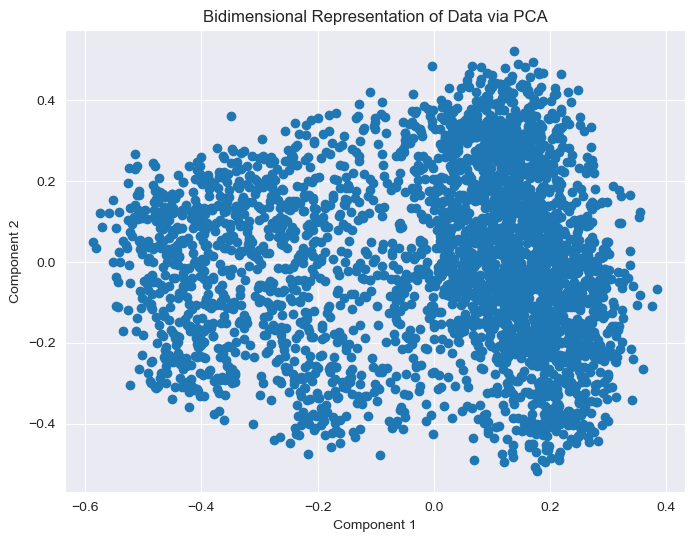

In [107]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# Initialize PCA model with specified parameters
dim_model = PCA(n_components=5)

# Fit the model to the data and transform it
reduced_embeddings_pca = dim_model.fit_transform(embeddings)

# embedding now contains the 5-dimensional representation of the input data
display(pd.DataFrame(embeddings)[:5])
display(pd.DataFrame(reduced_embeddings_pca)[:5])


# Plot the bidimensional data
plt.figure(figsize=(8, 6))
plt.scatter(reduced_embeddings_pca[:, 0], reduced_embeddings_pca[:, 1])
plt.title('Bidimensional Representation of Data via PCA')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

In [108]:
from sklearn.decomposition import PCA

dim_model = PCA(n_components=5)

topic_model = BERTopic(umap_model = dim_model,
                       embedding_model = embedding_model)

topic_model_pca = topic_model.fit(docs_preprocessed, embeddings=embeddings)

get_topic_info(topic_model_pca)

,Topic,Count,Name,Representation
0,-1,1842,-1_genes_gene_sep_expression,"[genes, gene, sep, expression, study, genetic, associated, analysis, metabolism, metabolic]"
1,0,1104,0_patients_associated_risk_sep,"[patients, associated, risk, sep, cancer, study, genetic, gene, variants, analysis]"
2,1,121,1_traits_genetic_feed_genes,"[traits, genetic, feed, genes, milk, selection, efficiency, feeding, cattle, lactation]"
3,2,85,2_genes_genome_analysis_species,"[genes, genome, analysis, species, evolution, sep, metabolism, pathway, metabolic, strains]"
4,3,72,3_zn_grain_fe_wheat,"[zn, grain, fe, wheat, content, rice, traits, breeding, iron, identified]"
5,4,67,4_genes_expression_analysis_plant,"[genes, expression, analysis, plant, starch, plants, stress, gene, genome, identified]"


In [109]:
topic_model_pca.visualize_documents(docs_preprocessed, embeddings=embeddings, sample= 0.1)

Skip dimensionality reduction
Although BERTopic applies dimensionality reduction as a default in its pipeline, this is a step that you might want to skip. We generate an "empty" model that simply returns the data pass it to:

In [34]:
from bertopic.dimensionality import BaseDimensionalityReduction

# Fit BERTopic without actually performing any dimensionality reduction
empty_dimensionality_model = BaseDimensionalityReduction()

topic_model = BERTopic(umap_model=empty_dimensionality_model,
                       embedding_model = embedding_model
                       )
topic_model_base = topic_model.fit(docs_preprocessed, embeddings=embeddings)

get_topic_info(topic_model_base)

,Topic,Count,Name,Representation
0,-1,5186,-1_sep_genes_gene_analysis,"[sep, genes, gene, analysis, study, expression, metabolism, metabolic, associated, protein]"
1,0,945,0_genes_analysis_cancer_study,"[genes, analysis, cancer, study, identified, expression, related, metabolism, gene, associated]"
2,1,48,1_patients_variants_variant_mutations,"[patients, variants, variant, mutations, gene, mutation, novel, clinical, sequencing, deficiency]"


## 3. Hierarchical Clustering

**HDBSCAN** :: *hierarchical density-based spatial clustering of applications with Noise* 

Used to generate *semantically similar document clusters*.\ 
Since HDBSCAN is a density-based clustering algorithm, the number of clusters is automatically chosen based on the minimum distance to be considered as a neighbor.
 
Read the Docs: https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html

In [17]:
pd.DataFrame(reduced_embeddings).head()

,0,1,2,3,4
0,3.581338,5.451906,8.064962,-2.011083,3.404852
1,4.291038,7.916210,4.070705,-2.315914,3.037540
2,3.917480,6.844153,6.340874,-0.532011,4.569130
3,3.780594,7.231764,5.718599,-2.144682,3.813079
4,3.833729,7.085404,7.522668,-1.271278,3.204895


In [110]:
import hdbscan

# Define clusterer 
clusterer = hdbscan.HDBSCAN(min_cluster_size = 10, # HDBSCAN(min_topic_size = 5) #default
                            metric='euclidean',
                            cluster_selection_method='eom',
                            prediction_data=False,
                            gen_min_span_tree=True)

simple test data


array([[ 0.26182584, -0.09644137],
       [ 0.85324262,  0.48796829],
       [ 1.33159509, -0.46142105],
       [ 0.94383316,  0.39879396],
       [-0.18830575,  0.98500432]])

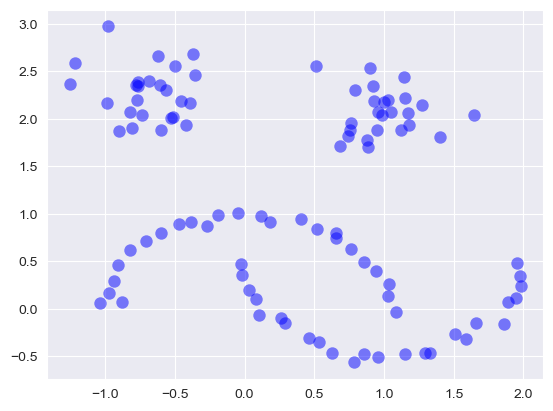

minimum spanning tree


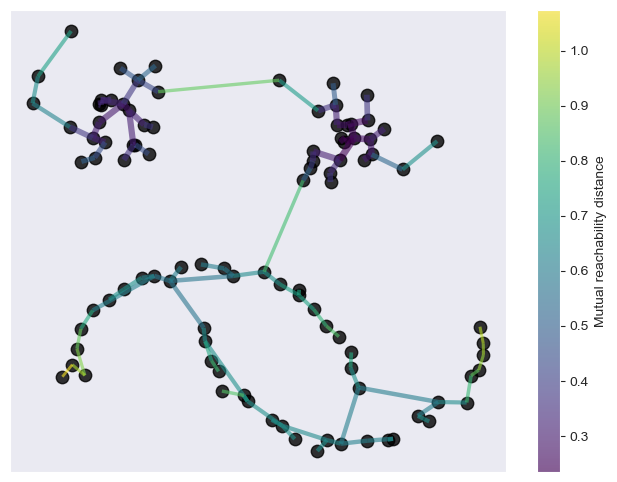

In [37]:
# Generate smple test data
moons, _ = data_.make_moons(n_samples=50, noise=0.05)
blobs, _ = data_.make_blobs(n_samples=50, centers=[(-0.75,2.25), (1.0, 2.0)], cluster_std=0.25)
simple_test_data = np.vstack([moons, blobs])

# Plot test data
plot_kwds = {'alpha' : 0.5, 's' : 80, 'linewidths':0}
plt.scatter(simple_test_data[:, 0], simple_test_data[:, 1], color='b', **plot_kwds)
print('simple test data')
display(simple_test_data[:5])
plt.show()

# fit data
clusterer.fit(simple_test_data)

plt.figure(figsize=(8, 6))
clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      node_size=80,
                                      edge_linewidth=2)
print('minimum spanning tree')
plt.show()

Apply HDBSCAN to our reduced emebeddings

text reduced embeddings (2 components)


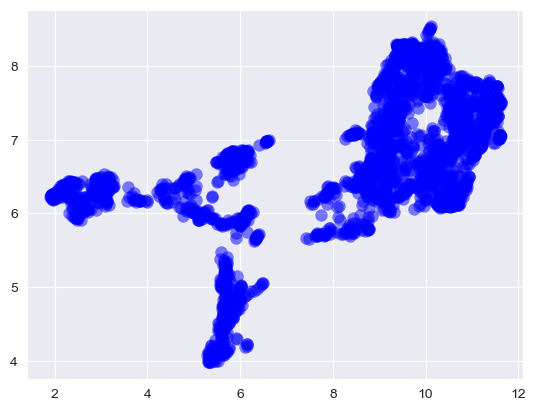

In [111]:
# Get test data from our embeddings
sample = len(reduced_embeddings) #sample = 100 

# Plot first 2 components:
component_1 = reduced_embeddings[:sample, 0]
component_2 = reduced_embeddings[:sample, 1]
plot_kwds = {'alpha' : 0.5, 's' : 80, 'linewidths':0}
plt.scatter(component_1, component_2, color='b', **plot_kwds)
print('text reduced embeddings (2 components)')
plt.show()



minimum spanning tree (5 components)


array([[9.242762 , 7.1230683, 9.025348 , 6.5257573, 3.1497664],
       [4.9652514, 6.0676217, 7.110082 , 6.083025 , 1.9725322],
       [2.3065155, 6.2309365, 4.8388643, 5.2681646, 3.1120253],
       [2.2857902, 6.350803 , 5.3106055, 5.161714 , 2.6614668],
       [2.1075113, 6.2195263, 5.288341 , 5.090033 , 2.687271 ]],
      dtype=float32)

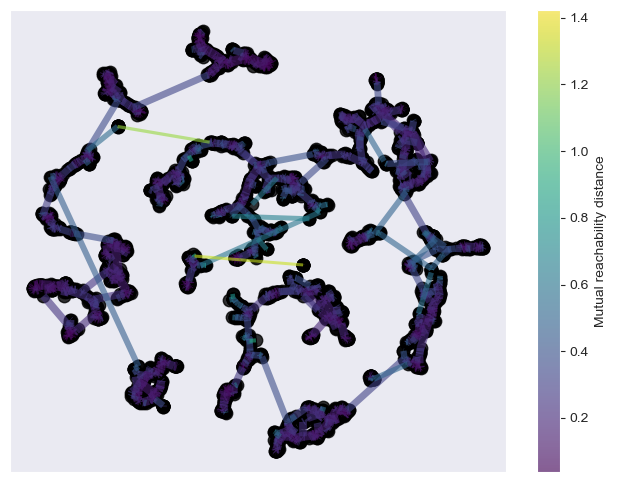

In [112]:
# fit data (5 components)
components = 5 # choose test data dimensinality
test_data_emb = reduced_embeddings[:sample, 0:components]  
clusterer.fit(test_data_emb)

plt.figure(figsize=(8, 6))
clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      node_size=80,
                                      edge_linewidth=2)
print('\n\nminimum spanning tree (5 components)')
display(test_data_emb[:5])
plt.show()

Single Linkage Tree


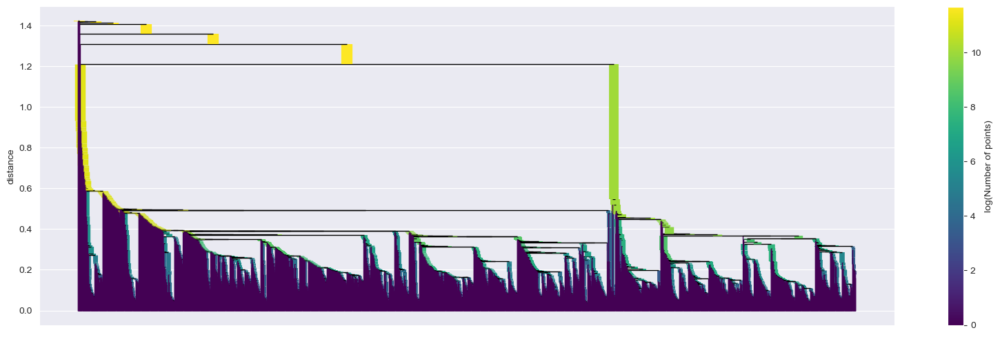

Condensed Tree


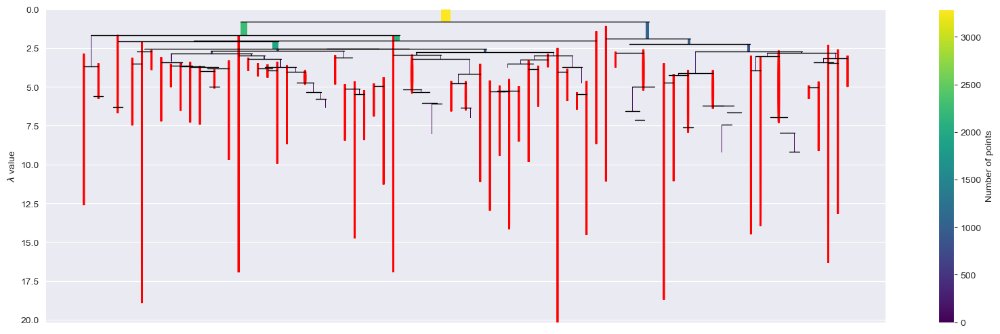

In [113]:
# The algorithm builds a complete dendrogram, accessible through the "single_linkage_tree_" attribute
print('Single Linkage Tree')
plt.figure(figsize=(20, 6))
clusterer.single_linkage_tree_.plot(cmap='viridis', colorbar=True)
plt.show()

# We can access the basic hierarchy via the "condensed_tree_" attribute of the clusterer object.
print('Condensed Tree')
plt.figure(figsize=(20, 6))
clusterer.condensed_tree_.plot(select_clusters=True, 
                               selection_palette=sns.color_palette())
plt.show()

The number of clusters detected corresponds to the number of topics by BERTopic

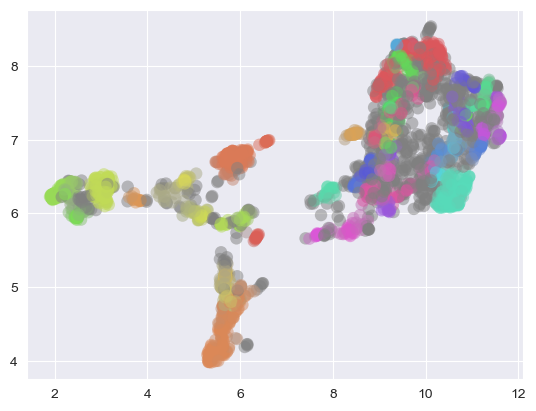

In [119]:
# Highlight Clusters

# Retrieve the number of clusters
number_of_clusters = len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0)

palette = sns.color_palette("hls", number_of_clusters) # define color palette

cluster_colors = [sns.desaturate(palette[col], sat)
                  if col >= 0 else (0.5, 0.5, 0.5) for col, sat in
                  zip(clusterer.labels_, clusterer.probabilities_)]

plt.scatter(test_data_emb[:, 0], test_data_emb[:, 1], c=cluster_colors, **plot_kwds)

plt.show()

### Apply to BERTopic model

In [ ]:
embedding_model = SentenceTransformer("all-mpnet-base-v2")
embeddings = load_embeddings("embeddings_large.pkl")

In [19]:
from hdbscan.hdbscan_ import HDBSCAN

# Find the optimal number of clusters with HDBscan
# Application: removing Noise

hdbscan_model = HDBSCAN(min_cluster_size=10,   # BERTopic(min_topic_size = 10) #default
                        metric='euclidean', 
                        cluster_selection_method='eom', 
                        prediction_data=False)

In [120]:
topic_model = BERTopic(hdbscan_model=hdbscan_model,  # <--
                       umap_model=umap_model,
                       embedding_model = embedding_model)

topic_model_hdbscan = topic_model.fit(docs_preprocessed, embeddings)

get_topic_info(topic_model_hdbscan)

,Topic,Count,Name,Representation
0,-1,832,-1_associated_sep_expression_gene,"[associated, sep, expression, gene, genes, study, patients, risk, levels, disease]"
1,0,235,0_obesity_intake_risk_diabetes,"[obesity, intake, risk, diabetes, bmi, fat, leptin, body, associated, weight]"
2,1,220,1_cancer_tumor_cells_cell,"[cancer, tumor, cells, cell, expression, tumors, metabolic, survival, prognosis, immune]"
3,2,188,2_traits_milk_feed_cattle,"[traits, milk, feed, cattle, cows, efficiency, dairy, genetic, lactation, selection]"
4,3,165,3_strains_genome_strain_coli,"[strains, genome, strain, coli, genes, yeast, isolates, acid, production, metabolic]"
5,4,144,4_plant_genes_drought_stress,"[plant, genes, drought, stress, analysis, expression, plants, leaf, tolerance, transcriptome]"
6,5,86,5_cancer_risk_95_ci,"[cancer, risk, 95, ci, or, colorectal, crc, digestive, association, mr]"
7,6,86,6_seed_content_bean_breeding,"[seed, content, bean, breeding, fe, grain, traits, markers, maize, zn]"
8,7,71,7_fish_species_growth_genes,"[fish, species, growth, genes, temperature, variation, population, differentiation, genetic, populations]"
9,8,61,8_metabolites_network_data_oa,"[metabolites, network, data, oa, metabolic, pathways, pathway, gene, based, disease]"


By reducing the minimum cluster size, I obtain a much larger number of clusters and thus topics

In [121]:
hdbscan_model_ = HDBSCAN(min_cluster_size=5,   #BERTopic(min_topic_size = 10) #default
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=False)

topic_model = BERTopic(hdbscan_model=hdbscan_model_,
                       umap_model=umap_model,
                       embedding_model = embedding_model)

topic_model_hdbscan = topic_model.fit(docs_preprocessed, embeddings)

get_topic_info(topic_model_hdbscan)

,Topic,Count,Name,Representation
0,-1,829,-1_associated_sep_genes_study,"[associated, sep, genes, study, risk, gene, obesity, expression, patients, genetic]"
1,0,220,0_tumor_cancer_cells_cell,"[tumor, cancer, cells, cell, tumors, expression, prognosis, survival, prognostic, immune]"
2,1,198,1_traits_milk_feed_cattle,"[traits, milk, feed, cattle, cows, dairy, efficiency, lactation, pigs, selection]"
3,2,169,2_strains_strain_coli_genome,"[strains, strain, coli, genome, yeast, isolates, production, cerevisiae, acid, metabolic]"
4,3,66,3_fish_growth_species_genes,"[fish, growth, species, genes, aquaculture, variation, temperature, differentiation, plasticity, sea]"
...,...,...,...,...
123,122,5,122_duodenal_i1307k_apc_fap,"[duodenal, i1307k, apc, fap, endoscopic, germline, crc, familial, polyposis, ls]"
124,123,5,123_age_aging_epigenetic_dnam,"[age, aging, epigenetic, dnam, ageing, physical, exercise, healthy, health, mediterranean]"
125,124,5,124_cognitive_es_brain_5hmc,"[cognitive, es, brain, 5hmc, vitamins, malnutrition, early, environment, vitamin, mci]"
126,125,5,125_ir_colorectal_crc_cancer,"[ir, colorectal, crc, cancer, risk, women, postmenopausal, lifestyles, factors, lifestyle]"


## 4. Topic Tokenization

In topic modeling, the quality of the **topic representations** is key for interpreting the topics, communicating results, and understanding patterns. It is of utmost importance to make sure that the topic representations fit with your use case.

Bag of Words (BoW)
- BoW is a representation of text data that describes the occurrence of words within a document.
- It is simpler; it transforms text into a fixed-size vector, where each element corresponds to the presence or count of a word in the vocabulary.

Term Frequency-Inverse Document Frequency (TF-IDF)
- TF-IDF is a statistical measure that evaluates the importance of a word in a document relative to a collection or corpus.
- It assigns more weight to words that are unique to certain documents and less to common words.

Word Embeddings (e.g., Word2Vec, GloVe)
- These are dense vector representations of words, trained to capture semantic relationships.
- They provide context to word usage by positioning similar words close to each other in vector space.


### CountVectorizer

- A specific implementation of BoW in libraries like scikit-learn.
- It focuses on counting the presence of each word in a document.

CountVectorizer operates by **tokenizing** the text data and counting the occurrences of each token. It then creates a matrix where the rows represent the documents, and the columns represent the tokens. The cell values indicate the frequency of each token in each document. This matrix is known as the “*document-term matrix*”.

In the example, the *fit_transform* method of CountVectorizer both *fits* the vectorizer to the documents (learns the vocabulary) and *transforms* the documents into a document-term matrix. The resulting matrix represents the frequency of each token in each document.

https://spotintelligence.com/2023/05/17/countvectorizer/#:~:text=CountVectorizer%20is%20a%20text%20preprocessing,machine%20learning%20library%20in%20Python.

In [82]:
from sklearn.feature_extraction.text import CountVectorizer

corpus = [
    'This is the first document.',
    'This document is the second document.',
    'And this is the third one.',
    'Is this the first document?',
]

# Create an instance of CountVectorizer
vectorizer = CountVectorizer()

# Fit the vectorizer to the documents and transform the documents into a document-term matrix
X = vectorizer.fit_transform(corpus)

# Get the feature names (tokens)
feature_names = vectorizer.get_feature_names_out()

n= 0
for sent in corpus:
    print(str(n)+': ',sent)
    n += 1

print('\nFeature names:')
print(feature_names, '\n')

print('Document-term matrix:')
print(X.toarray())

0:  This is the first document.
1:  This document is the second document.
2:  And this is the third one.
3:  Is this the first document?

Feature names:
['and' 'document' 'first' 'is' 'one' 'second' 'the' 'third' 'this'] 

Document-term matrix:
[[0 1 1 1 0 0 1 0 1]
 [0 2 0 1 0 1 1 0 1]
 [1 0 0 1 1 0 1 1 1]
 [0 1 1 1 0 0 1 0 1]]


In [164]:
# Set ngrams (how many words composes a token)  
vectorizer = CountVectorizer(ngram_range=(2, 2)) 
X = vectorizer.fit_transform(corpus)
feature_names = vectorizer.get_feature_names_out()

print('Feature names:')
print(feature_names, '\n')
print('Document-term matrix:')
print(X.toarray())

Feature names:
['and this' 'document is' 'first document' 'is the' 'is this'
 'second document' 'the first' 'the second' 'the third' 'third one'
 'this document' 'this is' 'this the'] 

Document-term matrix:
[[0 0 1 1 0 0 1 0 0 0 0 1 0]
 [0 1 0 1 0 1 0 1 0 0 1 0 0]
 [1 0 0 1 0 0 0 0 1 1 0 1 0]
 [0 0 1 0 1 0 1 0 0 0 0 0 1]]


In [111]:
# Remove Stopwords
vectorizer = CountVectorizer(stop_words="english")
X = vectorizer.fit_transform(corpus)
feature_names = vectorizer.get_feature_names_out()

print('Feature names:')
print(feature_names, '\n')
print('Document-term matrix:')
print(X.toarray())

Feature names:
['document' 'second'] 

Document-term matrix:
[[1 0]
 [2 1]
 [0 0]
 [1 0]]


### Apply to BERTopic model

In [122]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

# Apply a custom CountVectorizer
vectorizer_model = CountVectorizer(min_df=10,
                                   ngram_range=(1, 1),
                                   stop_words="english" # stop word removal
                                   )

topic_model = BERTopic(vectorizer_model=vectorizer_model, # <--
                       hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model = embedding_model
                       )

topic_model_vector = topic_model.fit(docs_preprocessed, embeddings)

get_topic_info(topic_model_vector).head(10)

,Topic,Count,Name,Representation
0,-1,832,-1_associated_sep_expression_gene,"[associated, sep, expression, gene, study, genes, patients, risk, levels, disease]"
1,0,235,0_obesity_intake_risk_diabetes,"[obesity, intake, risk, diabetes, bmi, fat, leptin, body, weight, allele]"
2,1,220,1_cancer_tumor_cells_cell,"[cancer, tumor, cells, cell, expression, tumors, metabolic, survival, prognosis, immune]"
3,2,188,2_traits_milk_efficiency_genetic,"[traits, milk, efficiency, genetic, selection, genes, energy, candidate, genomic, feeding]"
4,3,165,3_strains_strain_genome_yeast,"[strains, strain, genome, yeast, genes, production, acid, metabolic, bacteria, species]"
5,4,144,4_plant_genes_stress_plants,"[plant, genes, stress, plants, analysis, expression, tolerance, transcriptome, sucrose, species]"
6,5,86,5_cancer_risk_95_ci,"[cancer, risk, 95, ci, colorectal, digestive, mr, association, cancers, gastric]"
7,6,86,6_content_breeding_fe_markers,"[content, breeding, fe, markers, traits, yield, trait, oil, qtl, iron]"
8,7,71,7_species_growth_temperature_genes,"[species, growth, temperature, genes, differentiation, variation, population, populations, genetic, snps]"
9,8,61,8_metabolites_network_data_metabolic,"[metabolites, network, data, metabolic, pathways, pathway, networks, based, gene, metabolomics]"


Apply custom Vectorizer model on un-processed docs 

In [125]:
embedding_model_mini = SentenceTransformer("all-MiniLM-L6-v2") 
embeddings_raw = load_embeddings('embeddings_raw_large.pkl')

In [126]:
# Apply custom Vectorizer model on un-processed docs:
# obtaining fine representation without preprocessing

topic_model = BERTopic(vectorizer_model=vectorizer_model, # <--
                       hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model = embedding_model_mini
                       )
topic_model_vector = topic_model.fit(docs_raw, embeddings_raw) # <--

get_topic_info(topic_model_vector).head(10)

,Topic,Count,Name,Representation
0,-1,951,-1_expression_sep_genes_gene,"[expression, sep, genes, gene, cell, metabolic, associated, metabolism, analysis, study]"
1,0,322,0_genes_content_traits_identified,"[genes, content, traits, identified, plant, yield, analysis, genetic, trait, genome]"
2,1,226,1_obesity_intake_fat_diabetes,"[obesity, intake, fat, diabetes, bmi, risk, dietary, allele, genetic, association]"
3,2,216,2_traits_feed_milk_efficiency,"[traits, feed, milk, efficiency, genetic, selection, genes, energy, candidate, genomic]"
4,3,202,3_patients_variants_variant_deficiency,"[patients, variants, variant, deficiency, clinical, patient, pathogenic, mutations, mutation, syndrome]"
5,4,104,4_cancer_risk_95_ci,"[cancer, risk, 95, ci, digestive, cancers, breast, association, polymorphism, susceptibility]"
6,5,103,5_cancer_tumor_patients_cancers,"[cancer, tumor, patients, cancers, tumors, gastric, prognosis, immune, gastrointestinal, digestive]"
7,6,95,6_aging_age_methylation_epigenetic,"[aging, age, methylation, epigenetic, dna, restriction, changes, interventions, old, related]"
8,7,70,7_feeding_variation_genes_behavioral,"[feeding, variation, genes, behavioral, diet, mitochondrial, expression, genetic, behavior, food]"
9,8,64,8_fish_growth_temperature_species,"[fish, growth, temperature, species, genes, differentiation, variation, genetic, snps, population]"


It is possible to fine-tune topic representations even after training the BERTopic model.

In [129]:
# 1. Default Settings
topic_model = BERTopic(hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model = embedding_model_mini
                       )
topic_model_base = topic_model.fit(docs_raw, embeddings=embeddings_raw)
print('Default Settings:')
get_topic_info(topic_model_base).head()

Default Settings:


,Topic,Count,Name,Representation
0,-1,951,-1_and_of_the_in,"[and, of, the, in, to, that, with, is, for, we]"
1,0,322,0_and_the_of_for,"[and, the, of, for, in, genes, grain, were, to, content]"
2,1,226,1_with_and_the_obesity,"[with, and, the, obesity, of, in, intake, fat, was, to]"
3,2,216,2_traits_and_the_for,"[traits, and, the, for, feed, were, of, milk, to, in]"
4,3,202,3_patients_variants_the_with,"[patients, variants, the, with, of, in, variant, clinical, deficiency, and]"


In [130]:
# 2. Fine-tune topic representations after training

# update_topics
topic_model_base.update_topics(docs_raw, vectorizer_model=vectorizer_model)  # <--

print('Fine-tuned representation:')
get_topic_info(topic_model_base).head()

Fine-tuned representation:


,Topic,Count,Name,Representation
0,-1,951,-1_expression_sep_genes_gene,"[expression, sep, genes, gene, cell, metabolic, associated, metabolism, analysis, study]"
1,0,322,0_genes_content_traits_identified,"[genes, content, traits, identified, plant, yield, analysis, genetic, trait, genome]"
2,1,226,1_obesity_intake_fat_diabetes,"[obesity, intake, fat, diabetes, bmi, risk, dietary, allele, genetic, association]"
3,2,216,2_traits_feed_milk_efficiency,"[traits, feed, milk, efficiency, genetic, selection, genes, energy, candidate, genomic]"
4,3,202,3_patients_variants_variant_deficiency,"[patients, variants, variant, deficiency, clinical, patient, pathogenic, mutations, mutation, syndrome]"


## 5. Weight tokens (c-TF-IDF)
Method by which the most representative words of each Topic are chosen

### TfidfVectorizer
TfidfVectorizer stands for “*Term Frequency-Inverse Document Frequency Vectorizer*”. It builds upon the concept of CountVectorizer but incorporates the TF-IDF weighting scheme. TF-IDF is a numerical statistic that reflects the importance of a term (token) in a document within a larger corpus.

The TF-IDF  weight function is a function used in **information retrieval** to measure the importance of a term with respect to a document or collection of documents. The TF-IDF value for a term in a document is calculated by multiplying the term frequency (TF) and inverse document frequency (IDF) components:

$$\text{TF-IDF} = \text{TF} \times \text{IDF}$$

Where:

$$\text{TF} = \frac{\text{Number of occurrences of term}}{\text{Total number of terms in the document}}$$
$$\text{IDF} = \log\left(\frac{\text{Total number of documents}}{\text{Number of documents containing the term}}\right)$$


*TfidfTransformer*: The formula used to compute the TF-IDF for a term \( t \) of a document \( d \) in a document set is given by 

$$ \text{tf-idf}(t, d) = \text{tf}(t, d) \times \text{idf}(t) $$

where the IDF is computed as 

$$ \text{idf}(t) = \log \left( \frac{n}{\text{df}(t)} \right) + 1 \quad \text{(if } \text{smooth\_idf} = \text{False)} $$

If $\( \text{smooth\_idf} = \text{True} \)$ (the default), the constant "1" is added to both the numerator and the denominator of the IDF, as if an extra document were seen containing every term in the collection exactly once, which prevents zero divisions:

$$ \text{idf}(t) = \log \left( \frac{1 + n}{1 + \text{df}(t)} \right) + 1 $$

In [17]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

corpus = [
    'This is the first document.',
    'This document is the second document.',
    'And this is the third one.',
    'Is this the first document?',
]

# CountVectorizer
count_vectorizer = CountVectorizer()  # Create a bag of words representation
X_count = count_vectorizer.fit_transform(corpus)

# TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()  # Create a TF-IDF representation
X_tfidf = tfidf_vectorizer.fit_transform(corpus)

# Get the feature names (tokens)
feature_names_count = count_vectorizer.get_feature_names_out()
feature_names_tfidf = tfidf_vectorizer.get_feature_names_out()

# Print the feature names for CountVectorizer
print("CountVectorizer feature names:", feature_names_count)

# Print the document-term matrix for CountVectorizer
print("\nCountVectorizer document-term matrix:")
print(X_count.toarray())

# Print the feature names for TfidfVectorizer
print("\nTfidfVectorizer feature names:", feature_names_tfidf)

# Print the document-term matrix for TfidfVectorizer
print("\nTfidfVectorizer document-term matrix:")
X_tfidf.toarray()

CountVectorizer feature names: ['and' 'document' 'first' 'is' 'one' 'second' 'the' 'third' 'this']

CountVectorizer document-term matrix:
[[0 1 1 1 0 0 1 0 1]
 [0 2 0 1 0 1 1 0 1]
 [1 0 0 1 1 0 1 1 1]
 [0 1 1 1 0 0 1 0 1]]

TfidfVectorizer feature names: ['and' 'document' 'first' 'is' 'one' 'second' 'the' 'third' 'this']

TfidfVectorizer document-term matrix:


array([[0.        , 0.46979139, 0.58028582, 0.38408524, 0.        ,
        0.        , 0.38408524, 0.        , 0.38408524],
       [0.        , 0.6876236 , 0.        , 0.28108867, 0.        ,
        0.53864762, 0.28108867, 0.        , 0.28108867],
       [0.51184851, 0.        , 0.        , 0.26710379, 0.51184851,
        0.        , 0.26710379, 0.51184851, 0.26710379],
       [0.        , 0.46979139, 0.58028582, 0.38408524, 0.        ,
        0.        , 0.38408524, 0.        , 0.38408524]])

**c-TF-IDF**
In BERTopic, in order to get an accurate representation of the topics from our bag-of-words matrix, TF-IDF was adjusted to work on a cluster/categorical/topic level instead of a document level. This adjusted TF-IDF representation is called c-TF-IDF and takes into account what makes the documents in one cluster different from documents in another cluster.
Each cluster is converted to a single document instead of a set of documents. Then, we extract the frequency of word x in class c, where c refers to the cluster we created before. This results in our class-based tf representation. 

### Apply to BERTopic model

Some words appear quite often in every topic but are generally not considered stop words as found in the CountVectorizer(stop_words="english") list. To further reduce these frequent words, we can use reduce_frequent_words to take the square root of the term frequency after applying the weighting scheme.

In [15]:
embedding_model = large_model
embeddings_raw_large = load_embeddings("embeddings_raw_large.pkl")

In [22]:
from bertopic.vectorizers import ClassTfidfTransformer

vectorizer_model = CountVectorizer(stop_words="english")
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True) # <--

topic_model = BERTopic(ctfidf_model=ctfidf_model,   # <--
                       vectorizer_model=vectorizer_model,
                       hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model = embedding_model
                       )
#topic_model_vector = topic_model.fit(docs_preprocessed, embeddings)
topic_model_vector = topic_model.fit(docs_raw, embeddings_raw_large)

get_topic_info(topic_model_vector)

,Topic,Count,Name,Representation
0,-1,832,-1_epigenetic_disease_mir_cells,"[epigenetic, disease, mir, cells, risk, levels, function, histone, cell, breast]"
1,0,371,0_grain_wheat_rice_plant,"[grain, wheat, rice, plant, seed, zn, content, breeding, plants, maize]"
2,1,174,1_tumor_tumors_cancer_prognosis,"[tumor, tumors, cancer, prognosis, survival, prognostic, immune, microenvironment, pd, subtypes]"
3,2,169,2_diabetes_obesity_bmi_eating,"[diabetes, obesity, bmi, eating, fat, leptin, intake, overweight, obese, fto]"
4,3,146,3_strains_coli_strain_isolates,"[strains, coli, strain, isolates, bacteria, aureus, fermentation, cerevisiae, bacterial, engineering]"
5,4,116,4_aging_age_longevity_lifespan,"[aging, age, longevity, lifespan, ageing, telomere, sirt1, senescence, sirt6, old]"
6,5,113,5_milk_cows_dairy_cattle,"[milk, cows, dairy, cattle, lactation, feed, sheep, holstein, dmi, rfi]"
7,6,88,6_risk_95_cancer_crc,"[risk, 95, cancer, crc, ci, colorectal, prostate, escc, esophageal, mr]"
8,7,81,7_nafld_adipose_brown_adipocytes,"[nafld, adipose, brown, adipocytes, hfd, bat, wat, hepatic, mice, insulin]"
9,8,68,8_fish_aquaculture_temperature_sea,"[fish, aquaculture, temperature, sea, trout, salmon, bass, catfish, plasticity, species]"


In [23]:
topic_model_vector.get_topic(5)

[('milk', 0.36270084583480816),
 ('cows', 0.3548071026721979),
 ('dairy', 0.3203972838021197),
 ('cattle', 0.31311626110885926),
 ('lactation', 0.30750685702551456),
 ('feed', 0.29626641773681006),
 ('sheep', 0.2866493814189475),
 ('holstein', 0.2854343037966445),
 ('dmi', 0.2735467824918784),
 ('rfi', 0.26476009578882775)]

## 6. Fine-tune Topic Representations

### KeyBERTInspired¶
After having generated our topics with c-TF-IDF, we might want to do some fine-tuning based on the semantic relationship between keywords/keyphrases and the set of documents in each topic. KeyBERTInspired leverage c-TF-IDF to create a set of representative documents per topic and use those as our updated topic embedding. Then, calculates the similarity between candidate keywords and the topic embedding using the same embedding model that embedded the documents.

https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#keybertinspired

In [24]:
%%time
from bertopic.representation import KeyBERTInspired

# Fine-tune your topic representations
representation_model = KeyBERTInspired()

topic_model = BERTopic(representation_model=representation_model, # <--
                       #ctfidf_model=ctfidf_model,
                       #vectorizer_model=vectorizer_model,
                       hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model=embedding_model)

# Apply to un-processed corpus
topic_model_inspired = topic_model.fit(docs_raw, embeddings_raw_large) # <-- un-processed docs

# n.b. it takes longer runtime
get_topic_info(topic_model_inspired).head(10)

CPU times: total: 1min
Wall time: 54 s


,Topic,Count,Name,Representation
0,-1,832,-1_metabolism_metabolic_dietary_epigenetic,"[metabolism, metabolic, dietary, epigenetic, genome, genes, diet, methylation, genetic, protein]"
1,0,371,0_wheat_genotypes_genome_genomic,"[wheat, genotypes, genome, genomic, maize, grain, zinc, genes, transcriptome, genetic]"
2,1,174,1_glycolysis_metastasis_immunotherapy_cancers,"[glycolysis, metastasis, immunotherapy, cancers, genomic, tumors, cancer, tumor, carcinoma, metabolic]"
3,2,169,2_obesity_lipoprotein_cholesterol_dietary,"[obesity, lipoprotein, cholesterol, dietary, lipid, bmi, diet, genotype, genotypes, adiponectin]"
4,3,146,3_bacterium_bacteria_bacterial_streptococcus,"[bacterium, bacteria, bacterial, streptococcus, biofilm, genome, genomic, probiotic, coli, escherichia]"
5,4,116,4_telomere_epigenetic_senescence_methylation,"[telomere, epigenetic, senescence, methylation, aging, ageing, lifespan, metabolism, longevity, metabolic]"
6,5,113,5_cow_lactation_cattle_holstein,"[cow, lactation, cattle, holstein, cows, dairy, milk, genes, genetic, feeding]"
7,6,88,6_cancers_colorectal_cancer_dietary,"[cancers, colorectal, cancer, dietary, genotype, gastric, gastrointestinal, digestive, esophageal, genetic]"
8,7,81,7_adipogenesis_adipocytes_adipocyte_adipose,"[adipogenesis, adipocytes, adipocyte, adipose, lipid, obesity, metabolic, metabolism, fatty, cholesterol]"
9,8,68,8_aquaculture_genome_genes_fish,"[aquaculture, genome, genes, fish, transcriptome, genetic, fishes, salmon, carp, evolutionary]"


In [46]:
%%time
# Compare with basic output 
topic_model = BERTopic(hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model=embedding_model)

# Apply to un-processed corpus
topic_model_basic = topic_model.fit(docs_raw, embeddings_raw) # <-- un-processed docs

get_topic_info(topic_model_basic).head(10)

CPU times: total: 10.7 s
Wall time: 11.5 s


,Topic,Count,Name,Representation
0,-1,582,-1_the_of_and_to,"[the, of, and, to, in, for, we, data, gene, is]"
1,0,113,0_protein_the_of_binding,"[protein, the, of, binding, and, docking, to, ..."
2,1,97,1_link_networks_graph_network,"[link, networks, graph, network, prediction, t..."
3,2,81,2_graph_graphs_query_and,"[graph, graphs, query, and, in, the, social, o..."
4,3,75,3_extraction_biomedical_relation_the,"[extraction, biomedical, relation, the, protei..."
5,4,74,4_mirna_mirnas_the_and,"[mirna, mirnas, the, and, disease, lncrna, ass..."
6,5,68,5_drug_the_prediction_learning,"[drug, the, prediction, learning, of, and, gra..."
7,6,68,6_disease_genes_and_of,"[disease, genes, and, of, gene, the, to, in, f..."
8,7,49,7_of_the_biomolecular_systems,"[of, the, biomolecular, systems, to, and, is, ..."
9,8,47,8_genes_were_hcc_and,"[genes, were, hcc, and, cancer, the, of, expre..."


### Maximal Marginal Relevance
To decrease this redundancy and improve the diversity of keywords, we can use an algorithm called *Maximal Marginal Relevance* (MMR). MMR *considers the similarity of keywords/keyphrases with the document*, along with the similarity of already selected keywords and keyphrases. This results in a selection of keywords that maximize their within diversity with respect to the document.

In [47]:
%%time
from bertopic.representation import MaximalMarginalRelevance

# Fine-tune your topic representations
representation_model = MaximalMarginalRelevance()

# Apply to un processed corpus
topic_model = BERTopic(representation_model=representation_model,
                       hdbscan_model=hdbscan_model,
                       umap_model=umap_model,
                       embedding_model=embedding_model)
topic_model_mmr = topic_model.fit(docs_raw, embeddings_raw)

get_topic_info(topic_model_mmr).head(10)

CPU times: total: 1min 36s
Wall time: 37 s


,Topic,Count,Name,Representation
0,-1,582,-1_data_genes_network_protein,"[data, genes, network, protein, based, network..."
1,0,113,0_binding_docking_structure_structural,"[binding, docking, structure, structural, inte..."
2,1,97,1_networks_graph_network_prediction,"[networks, graph, network, prediction, node, e..."
3,2,81,2_graph_graphs_query_networks,"[graph, graphs, query, networks, subgraph, que..."
4,3,75,3_biomedical_model_interaction_ppi,"[biomedical, model, interaction, ppi, learning..."
5,4,74,4_mirnas_lncrna_rnas_circrna,"[mirnas, lncrna, rnas, circrna, rna, ncrna, ln..."
6,5,68,5_prediction_learning_graph_protein,"[prediction, learning, graph, protein, methods..."
7,6,68,6_genes_genetic_diseases_gwas,"[genes, genetic, diseases, gwas, data, associa..."
8,7,49,7_biomolecular_systems_networks_model,"[biomolecular, systems, networks, model, we, s..."
9,8,47,8_genes_carcinoma_hepatocellular_degs,"[genes, carcinoma, hepatocellular, degs, assoc..."


In [50]:
# Choose topic
n = 1
# Merge the three dataframes horizontally based on the index
merged_df = pd.concat([pd.DataFrame(topic_model_basic.get_topic(n), columns=['base', 'base']),
                       pd.DataFrame(topic_model_vector.get_topic(n), columns=['vector', 'vector']),
                       pd.DataFrame(topic_model_inspired.get_topic(n), columns=['inspired', 'inspired']),
                       pd.DataFrame(topic_model_mmr.get_topic(n), columns=['mmr', 'mmr'])],
                       axis=1)

# Display the horizontally merged dataframe
print('Comparison between different Representation methods')
merged_df

Comparison between different Representation methods


,base,base,vector,vector,inspired,inspired,mmr,mmr
0,link,0.035279,link,0.384127,convolutional,0.710489,networks,0.034540
1,networks,0.034540,node,0.331831,embeddings,0.695894,graph,0.031003
2,graph,0.031003,embedding,0.312319,embedding,0.641064,network,0.028252
3,network,0.028252,links,0.303421,predicting,0.639929,prediction,0.028236
4,prediction,0.028236,nodes,0.299773,datasets,0.583903,node,0.023739
5,the,0.025976,social,0.294504,topological,0.545585,embedding,0.022201
6,node,0.023739,prediction,0.275273,interactions,0.532562,nodes,0.020381
7,of,0.022723,networks,0.271854,algorithms,0.525242,embeddings,0.012666
8,in,0.022665,world,0.265314,prediction,0.524556,graphs,0.012631
9,embedding,0.022201,embeddings,0.263109,algorithm,0.521119,such,0.012022


# 4. Assemble your custom BERTopic model

Custom settings
https://maartengr.github.io/BERTopic/getting_started/tips_and_tricks/tips_and_tricks.html

Set Module parameters according the size and features of your corpus

In [86]:
from bertopic import BERTopic
from hdbscan import HDBSCAN
from umap import UMAP
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.representation import MaximalMarginalRelevance, KeyBERTInspired

# Set Custom Parameters 
models = ["allenai-specter", "all-mpnet-base-v2",  "all-MiniLM-L6-v2"]

embedding_model = "allenai-specter"
random_state = 123456  # UMAP random seed
min_cluster_size = 10  # default:5 HDBSCAN(); default:10 BERTopic()
 
min_topic_size = 10    # 10 default
top_n_words = 15       # 10 default
 

############################################

# Step 1 Extract embeddings (SBERT)
embedding_model_specter = SentenceTransformer(embedding_model) 
# ref: https://www.sbert.net/docs/pretrained_models.html 

# Step 2 - Reduce dimensionality 
umap_model = UMAP(n_neighbors  = 15, # num of high dimensional neighbours. 
                  n_components = 5,  # default:5 
                  min_dist     = 0.0, 
                  random_state = random_state) # default:None 

# Step 3 - Clusterize reduced embeddings 
hdbscan_model = HDBSCAN(min_cluster_size = min_cluster_size,
                        metric='euclidean', 
                        cluster_selection_method='eom', 
                        prediction_data=True)

# Step 4 - Tokenize topics 
vectorizer_model = CountVectorizer(stop_words="english", 
                                   lowercase=False) # lowercase=False to keep Acronyms uppercase

# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True) # False default

# Step 6 - Fine-tune topic representations 
representation_model = MaximalMarginalRelevance(diversity = 0.7,  # 0.1 default
                                                top_n_words = 15) # 10 default


############################################

# All steps together
topic_model = BERTopic(min_topic_size = min_topic_size,             # 10 default
                       top_n_words = top_n_words,                   # 10 default
                       calculate_probabilities = True,
                       embedding_model = embedding_model_specter,   # Step 1 - Extract embeddings
                       umap_model = umap_model,                     # Step 2 - Reduce dimensionality
                       hdbscan_model = hdbscan_model,               # Step 3 - Cluster reduced embeddings
                       vectorizer_model = vectorizer_model,         # Step 4 - Tokenize topics
                       ctfidf_model = ctfidf_model,                 # Step 5 - Extract topic words
                       representation_model= representation_model   # Step 6 - (Optional) Fine-tune topic representations
                       )

### Fit to model

In [52]:
%%time
# Extract Embeddings
embeddings_raw_specter = embedding_model_specter.encode(docs_raw, show_progress_bar=True)
print('(documents count, vector dimensions):',embeddings_raw_specter.shape)

Batches:   0%|          | 0/57 [00:00<?, ?it/s]

(documents count, vector dimensions): (1818, 768)
CPU times: total: 1min 52s
Wall time: 1min 58s


In [164]:
%%time
# Get Topic Model using custom embeddings
topic_model.fit(docs_raw, embeddings=embeddings_raw_specter)
probs = topic_model.probabilities_
topics = topic_model.topics_

#Alternatively:
#topics, probs = topic_model.fit_transform(docs_raw, embeddings=embeddings_raw)

print('embedding model: Specter')
get_topic_info(topic_model)

embedding model: Specter
CPU times: total: 12.7 s
Wall time: 13 s


,Topic,Count,Name,Representation
0,-1,518,-1_disease_gene_knowledge_network,"[disease, gene, knowledge, network, drug, mini..."
1,0,106,0_docking_structural_residues_ligand,"[docking, structural, residues, ligand, server..."
2,1,98,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,..."
3,2,92,2_genome_species_renewal_database,"[genome, species, renewal, database, Drosophil..."
4,3,86,3_complexes_PPI_detection_proteins,"[complexes, PPI, detection, proteins, conserve..."
5,4,63,4_OA_diabetic_insulin_treatment,"[OA, diabetic, insulin, treatment, Rhizoma, os..."
6,5,57,5_extraction_biomedical_syntactic_corpora,"[extraction, biomedical, syntactic, corpora, B..."
7,6,49,6_query_graph_social_matching,"[query, graph, social, matching, execution, re..."
8,7,47,7_GRN_causality_Bayesian_prior,"[GRN, causality, Bayesian, prior, reconstructi..."
9,8,46,8_host_COVID_virus_pathogen,"[host, COVID, virus, pathogen, coronavirus, pr..."


In [196]:
%%time
# Compare with "all-MiniLM-L6-v2", same parameters:

topic_model_base = BERTopic(min_topic_size = 10,
                            top_n_words = 15,
                            calculate_probabilities = True,
                            embedding_model = "all-MiniLM-L6-v2",
                            umap_model = umap_model,
                            hdbscan_model = hdbscan_model,
                            vectorizer_model = vectorizer_model,
                            ctfidf_model = ctfidf_model,
                            representation_model= representation_model
                            )
topic_model_base.fit(docs_raw, embeddings=embeddings_raw)

print('embedding model: BERT')
get_topic_info(topic_model_base).head(10)

embedding model: BERT
CPU times: total: 11.8 s
Wall time: 12.4 s


,Topic,Count,Name,Representation
0,-1,472,-1_gene_database_pathways_proteins,"[gene, database, pathways, proteins, disease, ..."
1,0,299,0_link_node_graph_representation,"[link, node, graph, representation, networks, ..."
2,1,114,1_docking_scoring_binding_residue,"[docking, scoring, binding, residue, native, i..."
3,2,75,2_associations_LPI_microRNAs_mRNA,"[associations, LPI, microRNAs, mRNA, diseases,..."
4,3,74,3_graphs_query_social_uncertain,"[graphs, query, social, uncertain, memory, mat..."
5,4,69,4_miR_carcinoma_differentially_hepatocellular,"[miR, carcinoma, differentially, hepatocellula..."
6,5,65,5_GWAS_glaucoma_ADs_POAG,"[GWAS, glaucoma, ADs, POAG, Alzheimer, phenoty..."
7,6,50,6_extraction_biomedical_entity_RNNs,"[extraction, biomedical, entity, RNNs, RE, F1,..."
8,7,47,7_biomolecular_bond_Boolean_dynamical,"[biomolecular, bond, Boolean, dynamical, react..."
9,8,45,8_complexes_clustering_PPI_protein,"[complexes, clustering, PPI, protein, noise, C..."


#### Save/Load Model

In [149]:
def save_topic_model(filename= "topic_model"):
    topic_model.save(data_path+filename)
    np.savetxt(data_path+filename+'_probs.txt', probs)
    
def load_topic_model(filename= "topic_model"):
    topic_model = BERTopic.load(data_path+filename)
    probs = np.loadtxt(data_path+filename+'_probs.txt')
    return topic_model, probs

save_topic_model()

2024-05-08 23:04:55,141 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


## Topic Info

In [165]:
# Return topics with top n words and their c-TF-IDF score
topic_rep = topic_model.get_topics()
topics_df = pd.DataFrame(topic_rep)#.T#.head()

# Probablities
probs_df = pd.DataFrame(probs)

# Topic FREQ
topic_freq = topic_model.get_topic_freq()
outliers = topic_freq.Count[0]

print('Total docs:',topic_freq.Count.sum())
print('Outliers:',outliers)
print('Ingroup:',topic_freq.Count.sum()-outliers)

# Topic INFO
topic_info = topic_model.get_topic_info()
#topic_info.head(5)

Total docs: 1818
Outliers: 44
Ingroup: 1774


## Document Info
Get information for each document

In [166]:
doc_info = get_document_info(topic_model, docs)
print('(Document count, features)', doc_info.shape)

(Document count, features) (1818, 8)


Get information for each document by topic

In [167]:
# Split Title from Abstract
doc_info['Title'] = doc_info.Document.str.split(" [SEP] ").str[0]
doc_info['Abstract']  = doc_info.Document.str.split(" [SEP] ").str[1]
doc_info = doc_info[['Topic','Title', 'Abstract', 'Name', 'Representation', 'Top_n_words', 'Probability','Representative_document']]

# Select Topic ID
topic_id = 1
doc_info[doc_info.Topic == topic_id].reset_index().sort_values(by='index')

,index,Topic,Title,Abstract,Name,Representation,Top_n_words,Probability,Representative_document
0,19,1,PathDIP 5: improving coverageãnd making enrich...,Pathwã y Data Integration Portal (PathDIP) isã...,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,0.059906,False
1,20,1,Large language models assisted multi-effect va...,Cerebral cavernous malformation (CCM) is a pol...,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,1.000000,False
2,31,1,The Imageable Genome,Understanding human disease on a molecular lev...,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,0.086279,False
3,48,1,A knowledge graph approach to predict and inte...,Background: Understanding the impact of gene i...,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,0.040804,False
4,49,1,In Silico Clinical Trials: Is It Possible?,"Modeling and simulation (M&S), including in si...",1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,0.072716,False
...,...,...,...,...,...,...,...,...,...
93,1735,1,Functional molecular units for guiding biomark...,The field of biomarker research has experience...,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,0.082553,False
94,1756,1,Family-based analysis identified CD2 as a susc...,Primary open angle glaucoma (POAG) is characte...,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,0.163346,False
95,1758,1,NeuroRDF: Semantic data integration strategies...,Neurodegenerative diseases are incurable and d...,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,0.049241,False
96,1770,1,Integrative literature and data mining to rank...,While the genomics-derived discoveries promise...,1_disease_variants_phenotype_GeneDive,"[disease, variants, phenotype, GeneDive, POAG,...",disease - variants - phenotype - GeneDive - PO...,0.066091,False


## Get Paper Titles for Topic

In [168]:
# get titles per topic
def get_titles_topic(topic_id):
    doc_topic = doc_info[doc_info.Topic == topic_id]
    print(len(doc_topic))
    titles_topic = doc_topic['Title'].reset_index(drop=True).astype(str)
    return titles_topic

# Select Topic ID
topic_id = 1
get_titles_topic(topic_id).head()

98


0    PathDIP 5: improving coverageãnd making enrich...
1    Large language models assisted multi-effect va...
2                                 The Imageable Genome
3    A knowledge graph approach to predict and inte...
4           In Silico Clinical Trials: Is It Possible?
Name: Title, dtype: object

In [169]:
# Print the top n words for / c-TF-IDF scores for a specific topic (here the 0)
topic_id = 1
#pd.Series(topic_model.get_topic(topic_id))
topics_df[topic_id]

0            (disease, 0.2526515572292488)
1          (variants, 0.23096683793523828)
2          (phenotype, 0.2111534785579746)
3          (GeneDive, 0.20378257883091236)
4              (POAG, 0.20378257883091236)
5     (prioritization, 0.2010597016052836)
6          (circadian, 0.1976981405130845)
7             (human, 0.19520923520660757)
8       (association, 0.19266086964163606)
9                (RDF, 0.1907286214975229)
10         (glaucoma, 0.18303442957795868)
11    (schizophrenia, 0.18178110703877431)
12             (Lynx, 0.18078084241327294)
13             (drug, 0.17240245266915255)
14           (genome, 0.17000356935442856)
Name: 1, dtype: object

# 5. Topic Visualization¶

Topic Visualization¶
Evaluating topic models can be rather difficult due to the somewhat subjective nature of evaluation. Visualizing different aspects of the topic model helps in understanding the model and makes it easier to tweak the model to your liking.

| Method                                      | Code                                    |
|--------------------------------------------|-----------------------------------------|
| Visualize Topics                            | `.visualize_topics()`                     |
| Visualize Documents                         | `.visualize_documents()`                  |
| Visualize Document Hierarchy                | `.visualize_hierarchical_documents()`     |
| Visualize Topic Hierarchy                   | `.visualize_hierarchy()`                  |
| Visualize Topic Tree                        | `.get_topic_tree(hierarchical_topics)`    |
| Visualize Topic Terms                       | `.visualize_barchart()`                   |
| Visualize Topic Similarity                  | `.visualize_heatmap()`                    |
| Visualize Term Score Decline                | `.visualize_term_rank()`                  |
| Visualize Topic Probability Distribution    | `.visualize_distribution(probs[0])`       |
| Visualize Topics over Time                  | `.visualize_topics_over_time(topics_over_time)` |
| Visualize Topics per Class                  | `.visualize_topics_per_class(topics_per_class)` |

## Document visualization

In [2]:
%%time
# visualize_documents (sample)

#topic_model.visualize_documents(docs_raw, sample= 0.05)  ! Computationally intensive !
topic_model.visualize_documents(docs_raw, embeddings=embeddings_raw_specter,sample= 0.1)

CPU times: total: 0 ns
Wall time: 0 ns


## Topic Visualization

### Intertopic Distance Map

After having trained our BERTopic model, we can iteratively go through hundreds of topics to get a good understanding of the topics that were extracted. However, that takes quite some time and lacks a global representation. Instead, we can visualize the topics that were generated in a way very similar to LDAvis.

We embed our c-TF-IDF representation of the topics in 2D using Umap and then visualize the two dimensions using plotly such that we can create an interactive view.

In [171]:
topic_model.visualize_topics() #can help you visualize topics generated with their sizes and corresponding words.

Eight macro-clusters can be highlighted, grouping together the 33 topics identified

# 6. Topic Evaluation
thanks to Topic Clusterization and Intertopic Distance Map it possible to select te most interesting macro-clusters.

In our case, we will select topics related to Semantic Technologies.

In [172]:
# Topics related to Semantic Technologies
pertinent_topics = [6, 20, 10, 22, 24, 5]

non_pertinent_topics = [topic for topic in topics if topic not in pertinent_topics]

print('Selected Topics:')
topic_info[topic_info.Topic.isin(pertinent_topics)][['Topic', 'Count', 'Name', 'Representation']]

Selected Topics:


,Topic,Count,Name,Representation
6,5,57,5_extraction_biomedical_syntactic_corpora,"[extraction, biomedical, syntactic, corpora, B..."
7,6,49,6_query_graph_social_matching,"[query, graph, social, matching, execution, re..."
11,10,44,10_embedding_node_link_social,"[embedding, node, link, social, real, temporal..."
21,20,31,20_links_prediction_social_assortativity,"[links, prediction, social, assortativity, cou..."
23,22,25,22_LDA_precedence_literature_INDRA,"[LDA, precedence, literature, INDRA, INO, keyp..."
25,24,23,24_BEL_extraction_BioNLP_event,"[BEL, extraction, BioNLP, event, BB, statement..."


### Highlight Selected Topics

In [1]:
# visualize_documents (sample)
topic_model.visualize_documents(docs_raw, topics= pertinent_topics, embeddings=embeddings_raw_specter,sample= 0.1, custom_labels=False)

NameError: name 'topic_model' is not defined

### Evaluation Results

total count: 1818
outliers count: 518
non pertinent count: 1071
pertinent count: 229


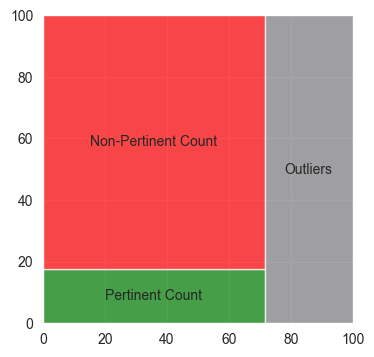

In [176]:
# Evaluation Results
topic_info_pertinent = topic_info[['Topic', 'Count','Name', 'Representation']][topic_info.Topic.isin(pertinent_topics)]
doc_info_s_pertinent = doc_info[doc_info.Topic.isin(pertinent_topics)]

total_count = topic_info.Count.sum()
pertinent_count = topic_info_pertinent.Count.sum()
outliers = topic_info.Count[0]
non_pertinent_count = total_count-outliers-pertinent_count

print('total count:', total_count)
print('outliers count:', outliers)
print('non pertinent count:', non_pertinent_count)
print('pertinent count:', pertinent_count)

import matplotlib.pyplot as plt
import squarify
labels = ['Pertinent Count', 'Non-Pertinent Count', 'Outliers']
sizes = [pertinent_count, non_pertinent_count, outliers]
colors = ['green', 'red', 'grey']

plt.figure(figsize=(4, 4))  
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.7)
#plt.savefig('evaluation_placeholder.png', dpi=300)
plt.show()

#topic_info_pertinent#.describe()

## Document Retrieval

### Get pertinent Papers bibliographic info

In [177]:
# get titles per topic
def get_titles_pertinent_topic(pertinent_topics):
    doc_topic = doc_info[doc_info['Topic'].isin(pertinent_topics)]
    print('Paper extracted:',len(doc_topic))
    titles_topic = doc_topic['Title'].reset_index(drop=True).astype(str)
    return titles_topic

pertinent_papers = get_titles_pertinent_topic(pertinent_topics)

Paper extracted: 229


In [178]:
# Filtering Scopus CSV for Titles
df_scopus = pd.read_csv(data_path+"scopus_trial.csv")
retrieved_pepers = df_scopus[df_scopus['Title'].isin(pertinent_papers)]
retrieved_pepers

,Authors,Author full names,Author(s) ID,Title,Year,Source title,Volume,Issue,Art. No.,Page start,...,DOI,Link,Abstract,Author Keywords,Index Keywords,Document Type,Publication Stage,Open Access,Source,EID
0,Yao K.-L.; Li W.-J.,"Yao, Kai-Lang (57219498675); Li, Wu-Jun (35179...",57219498675; 35179583900,Asymmetric Learning for Graph Neural Network b...,2024,ACM Transactions on Knowledge Discovery from Data,18,5,106,NaN,...,10.1145/3640347,https://www.scopus.com/inward/record.uri?eid=2...,Link prediction is a fundamental problem in ma...,large-scale graphs; link prediction; neural ne...,Forecasting; Graph neural networks; Graphic me...,Article,Final,All Open Access; Green Open Access,Scopus,2-s2.0-85189489854
1,Hu Y.; Chen Y.; Huang R.; Qin Y.; Zheng Q.,"Hu, Ying (57211690271); Chen, Yanping (5635006...",57211690271; 56350065400; 7402950347; 55684700...,A hierarchical convolutional model for biomedi...,2024,Information Processing and Management,61,1,103560,NaN,...,10.1016/j.ipm.2023.103560,https://www.scopus.com/inward/record.uri?eid=2...,Biomedical relation extraction aims to extract...,Biomedical text mining; Hierarchical convoluti...,Encoding (symbols); Extraction; Natural langua...,Article,Final,NaN,Scopus,2-s2.0-85175540422
11,Ozyer T.; Alhajj R.; Rokne J.; Sailunaz K.; Ju...,"Ozyer, Tansel (8914139000); Alhajj, Reda (7004...",8914139000; 7004187647; 7005166720; 5705642560...,KoExPubMed: A Tool for Effective and Customize...,2023,Proceedings of the 2023 IEEE/ACM International...,NaN,NaN,NaN,431,...,10.1145/3625007.3629127,https://www.scopus.com/inward/record.uri?eid=2...,An exponential growth in the literature in gen...,data mining; data visualization; gene interact...,Abstracting; Data mining; Genes; Learning syst...,Conference paper,Final,All Open Access; Hybrid Gold Open Access,Scopus,2-s2.0-85190624573
12,Chang Q.; Li X.; Duan Z.,"Chang, Qian (57898102500); Li, Xia (5719368597...",57898102500; 57193685970; 57220985713,Graph global attention network with memory: A ...,2024,Neural Networks,172,NaN,106115,NaN,...,10.1016/j.neunet.2024.106115,https://www.scopus.com/inward/record.uri?eid=2...,"With the proliferation of social media, the de...",Fake news detection; Graph classification; Gra...,Deep Learning; Disinformation; Gene Regulatory...,Article,Final,NaN,Scopus,2-s2.0-85182508093
21,Nandini Y.V.; Jaya Lakshmi T.; Enduri M.K.; Sh...,"Nandini, Y.V. (58744893900); Jaya Lakshmi, T. ...",58744893900; 58976165100; 56530775100; 5843496...,Extending Graph-Based LP Techniques for Enhanc...,2024,IEEE Access,12,NaN,NaN,51208,...,10.1109/ACCESS.2024.3385320,https://www.scopus.com/inward/record.uri?eid=2...,Many real-world problems can be modelled in th...,complex hyper-networks; hypergraphs; Link pred...,Drug interactions; Forecasting; Graph theory; ...,Article,Final,All Open Access; Gold Open Access,Scopus,2-s2.0-85189786139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1781,Hung H.H.; Bhowmick S.S.; Truong B.Q.; Choi B....,"Hung, Ho Hoang (55800895900); Bhowmick, Sourav...",55800895900; 7006796096; 55210278000; 15057709...,QUBLE: Towards blending interactive visual sub...,2014,VLDB Journal,23,3,NaN,401,...,10.1007/s00778-013-0322-1,https://www.scopus.com/inward/record.uri?eid=2...,"In a previous paper, we laid out the vision of...",Action-aware indices; Action-aware query proce...,Algorithms; Query processing; Action-aware ind...,Article,Final,NaN,Scopus,2-s2.0-84900857519
1784,de Melo G.; Weikum G.,"de Melo, Gerard (23088528100); Weikum, Gerhard...",23088528100; 56270327600,Taxonomic data integration from multilingual W...,2014,Knowledge and Information Systems,39,1,NaN,1,...,10.1007/s10115-012-0597-3,https://www.scopus.com/inward/record.uri?eid=2...,Information systems are increasingly making us...,Graph; Multilingual; Ranking; Taxonomy induction,Equivalence classes; Knowledge based systems; ...,Article,Final,NaN,Scopus,2-s2.0-84896546458
1786,Liang R.; Zhuge H.; Jiang X.; Zeng Q.; He X

# 7. Analyze Results

### Visualize Probablities or Distribution¶
Analyses the probability with which a document was attributed to a topic 

In [149]:
# To visualize the probabilities of topic assignment
import plotly.graph_objects as go
fig = go.Figure()
for n in range(3):
    fig = topic_model.visualize_distribution(probs[n],
                                             min_probability = 0,
                                             custom_labels = False)
    fig.show()

In [ ]:
!pip install jinja2

In [179]:
# Calculate the topic distributions on a token-level
topic_distr, topic_token_distr = topic_model.approximate_distribution(docs_raw, calculate_tokens=True, min_similarity=0)

In [180]:
# Visualize the token-level distributions
topic_n = 5
df = topic_model.visualize_approximate_distribution(docs_raw[topic_n], topic_token_distr[topic_n])
df

,Multitask,joint,learning,with,graph,autoencoders,for,predicting,potential,MiRNA,drug,associations,The,occurrence,of,many,diseases,is,associated,with,miRNA,abnormalities,Predicting,potential,drug,miRNA,associations,is,of,great,importance,for,both,disease,treatment,and,new,drug,discovery,Most,computation,based,approaches,learn,one,task,at,time,ignoring,the,information,contained,in,other,tasks,in,the,same,domain,Multitask,learning,can,effectively,enhance,the,prediction,performance,of,single,task,by,extending,the,valid,information,of,related,tasks,In,this,paper,we,presented,multitask,joint,learning,framework,MTJL,with,graph,autoencoder,for,predicting,the,associations,between,drugs,and,miRNAs,First,we,combined,multiple,pieces,of,information,to,construct,high,quality,similarity,network,of,both,drugs,and,miRNAs,and,then,used,graph,autoencoder,GAE,to,learn,their,embedding,representations,separately,Second,to,further,improve,the,embedding,quality,of,drugs,we,added,an,auxiliary,task,to,classify,drugs,using,the,learned,representations,Finally,the,embedding,representations,of,drugs,and,miRNAs,were,linearly


In [ ]:
topic_n = 2
doc_info[doc_info.Document == docs[topic_n]].reset_index().sort_values(by='index')#.head()#.T

### Similarity Matrix
Having generated topic embeddings, through both c-TF-IDF and embeddings, we can create a similarity matrix by simply applying cosine similarities through those topic embeddings. The result will be a matrix indicating how similar certain topics are to each other.

In [ ]:
!pip install -U kaleido

In [181]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
def show_similarty(topics):
    fig = go.Figure()
    fig = topic_model.visualize_heatmap(topics=topics,
                                        top_n_topics = 51,
                                        #n_clusters = 20,
                                        custom_labels=True,
                                        width = 1100,
                                        height = 1100)
    #fig.write_image("fig1.png", engine='kaleido')
    fig.show()
    
show_similarty(None) 

#### Apply to Selected Topics

In [182]:
topic_info[topic_info.Topic.isin(pertinent_topics)].Name

6     5_extraction_biomedical_syntactic_corpora
7                 6_query_graph_social_matching
11                10_embedding_node_link_social
21     20_links_prediction_social_assortativity
23           22_LDA_precedence_literature_INDRA
25               24_BEL_extraction_BioNLP_event
Name: Name, dtype: object

In [183]:
import numpy as np
import plotly.express as px
from sklearn.metrics.pairwise import cosine_similarity

distance_matrix = cosine_similarity(np.array(topic_model.topic_embeddings_)[1:, :])

# get labels
labels = topic_info[topic_info.Topic.isin(pertinent_topics)].Name
# Filter rows and columns based on indices
pertinent_topics.sort()
rows_to_keep = pertinent_topics
cols_to_keep = pertinent_topics
filtered_distance_matrix = distance_matrix[np.ix_(rows_to_keep, cols_to_keep)]

fig = px.imshow(filtered_distance_matrix,
                labels=dict(color="Similarity Score"),
                x=labels,
                y=labels,
                color_continuous_scale='GnBu'
                )
title: str = "<b>Similarity Matrix</b>"
fig.update_layout(
    title={
        'text': f"{title}",
        'y': .95,
        'x': 0.55,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(
            size=22,
            color="Black")
    },
    width=800,
    height=800,
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    ),
)
fig.update_layout(showlegend=True)
fig.update_layout(legend_title_text='Trend')
fig.write_image("heatmap_short.png", engine="kaleido", scale=3)
fig.show()

## Hierarchy Visualization

### Hierarchical clustering

In [184]:
topic_model.visualize_hierarchy(custom_labels=True, width=700, height=600) #The topics that were created can be hierarchically reduced.

### Hierarchical labels

In [185]:
hierarchical_topics = topic_model.hierarchical_topics(docs_raw)
hierarchical_topics

100%|██████████| 31/31 [00:02<00:00, 13.24it/s]


,Parent_ID,Parent_Name,Topics,Child_Left_ID,Child_Left_Name,Child_Right_ID,Child_Right_Name,Distance
30,62,graph_protein_interactions_network_prediction,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",56,HCC_miR_DEGs_hub_biomarkers,61,graph_prediction_interactions_information_lear...,1.188503
29,61,graph_prediction_interactions_information_lear...,"[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15...",60,gene_complexes_proteins_interactions_knowledge,59,graph_social_learning_node_link,1.002278
28,60,gene_complexes_proteins_interactions_knowledge,"[0, 1, 2, 3, 7, 8, 12, 13, 15, 18, 19, 22, 23,...",57,complexes_miRNA_protein_disease_similarity,58,biomolecular_biology_SBOL_behaviour_designs,0.929062
27,59,graph_social_learning_node_link,"[5, 6, 9, 10, 14, 16, 17, 20, 21]",44,social_query_real_subgraph_community,43,learning_embeddings_prediction_biomedical_graph,0.866366
26,58,biomolecular_biology_SBOL_behaviour_designs,"[12, 22, 24, 27, 29, 31]",53,BEL_extraction_topic_corpus_ANDSystem,55,biomolecular_SBOL_behaviour_designs_Neo4j,0.860870
25,57,complexes_miRNA_protein_disease_similarity,"[0, 1, 2, 3, 7, 8, 13, 15, 18, 19, 23, 25, 28]",28,extinction_memory_cell_mouse_single,54,complexes_protein_miRNA_similarity_binding,0.803709
24,56,HCC_miR_DEGs_hub_biomarkers,"[4, 11, 26, 30]",45,HCC_miR_hub_DEGs_pathways,26,Alzheimer_NIM_T2DM_Parkinson_CaMKII,0.769910
23,55,biomolecular_SBOL_behaviour_designs_Neo4j,"[12, 27, 31]",50,biomolecular_Neo4j_GRNsight_bond_reaction,31,synthetic_DICOM_SB_American_abstraction,0.769415
22,54,complexes_protein_miRNA_similarity_binding,"[0, 1, 2, 3, 7, 8, 13, 15, 18, 19, 23, 25]",52,complexes_protein_miRNA_interactions_similarity,19,Arabidopsis_wall_thaliana_drought_max,0.757085
21,53,BEL_extraction_topic_corpus_ANDSystem,"[22, 24, 29]",29,pharmacokinetics_PK_dose_vivo_drugs,47,BEL_extraction_ANDSystem_BioNLP_literature,0.749453


In [186]:
topic_model.visualize_hierarchy(custom_labels=True, width=700, height=600, hierarchical_topics=hierarchical_topics)
# hierarchical_topics: pd.DataFrame = None,

In [187]:
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

.
├─HCC_miR_DEGs_hub_biomarkers
│    ├─HCC_miR_hub_DEGs_pathways
│    │    ├─■──miR_HCC_5p_223_26a ── Topic: 30
│    │    └─DEGs_hub_patients_signaling_associated
│    │         ├─■──DEGs_prognostic_patients_hub_cisplatin ── Topic: 11
│    │         └─■──OA_diabetic_insulin_treatment_Rhizoma ── Topic: 4
│    └─■──Alzheimer_NIM_T2DM_Parkinson_CaMKII ── Topic: 26
└─graph_prediction_interactions_information_learning
     ├─gene_complexes_proteins_interactions_knowledge
     │    ├─complexes_miRNA_protein_disease_similarity
     │    │    ├─■──extinction_memory_cell_mouse_single ── Topic: 28
     │    │    └─complexes_protein_miRNA_similarity_binding
     │    │         ├─complexes_protein_miRNA_interactions_similarity
     │    │         │    ├─proteins_interactions_functional_genome_docking
     │    │         │    │    ├─■──similarity_GFD_term_WIS_NETSIM ── Topic: 23
     │    │         │    │    └─complexes_binding_protein_scoring_genome
     │    │         │    │         ├─complexes_p

## Terms Visualization

### Wordclouds

In [188]:
# Show wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    print(text)
    wc = WordCloud(background_color="white", max_words=1000, width=800, height=400)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

def create_wordcloud_multiple(topics, output_path='wordcloud.png', dpi=300, save=True):
    # Combine the values into a single dict
    merged_dict = {}
    for i in topics:
        text = {word: value for word, value in topic_model.get_topic(i)}
        merged_dict.update(text)
    plt.figure(figsize=(12, 8))
    
    # Generate WordCloud from frequencies
    wc = WordCloud(background_color="white", max_words=1000, width=1000, height=500)
    wc.generate_from_frequencies(merged_dict)
    # Display the WordCloud
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    if save:
        plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    plt.show()

def create_wordcloud_from_corpus(corpus, output_path='wordcloud.png', dpi=300, save=True):
    # Combine the text corpus into a single string
    text = ' '.join(corpus)
    plt.figure(figsize=(12, 8))
    
    # Generate WordCloud from the text
    wc = WordCloud(background_color="white", max_words=1000, width=1000, height=500)
    wc.generate(text)
    # Display the WordCloud
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    if save:
        plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    plt.show()

{'extraction': 0.41032091404177506, 'biomedical': 0.35977863675469474, 'syntactic': 0.3051027013614654, 'corpora': 0.28432687049000555, 'BioCreative': 0.2674263112211152, 'entity': 0.258913448520492, 'RNNs': 0.25761296971736397, 'neural': 0.2549187399427968, 'chemical': 0.2542387974843952, 'relations': 0.24158124424874786, 'sentence': 0.2374645226944788, 'PPI': 0.2331312626422521, 'ChemProt': 0.23285765720553647, 'dependency': 0.23023721102654215, 'literature': 0.23002939381483162}


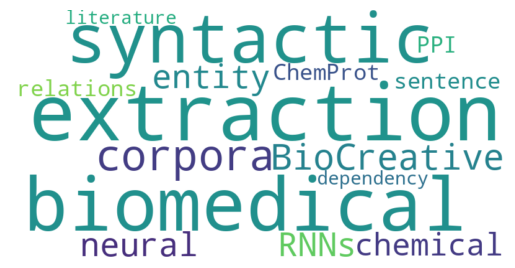

In [189]:
# Create wordcloud for single Topics
topic_id = 5
create_wordcloud(topic_model, topic=topic_id)

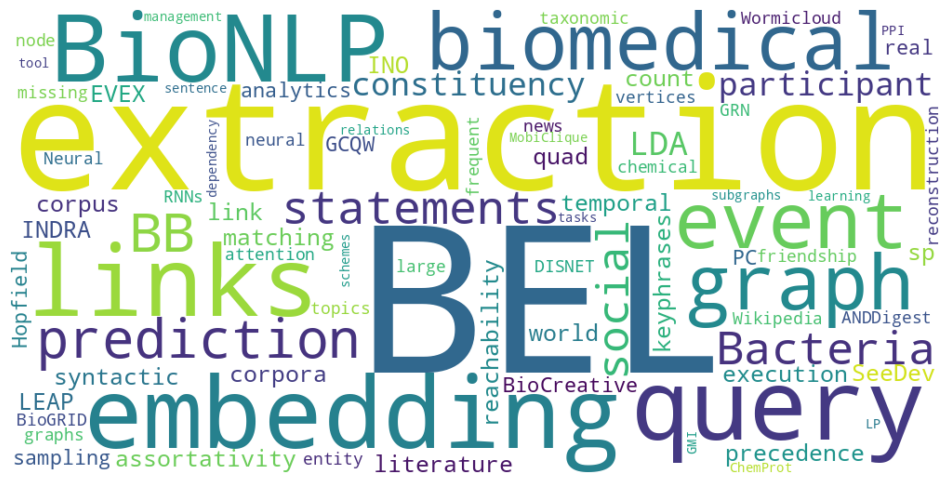

In [190]:
# Create wordcloud from multiple Topics
create_wordcloud_multiple(pertinent_topics, dpi=500, save = True, output_path=data_path+'wordcloud_topics.png')

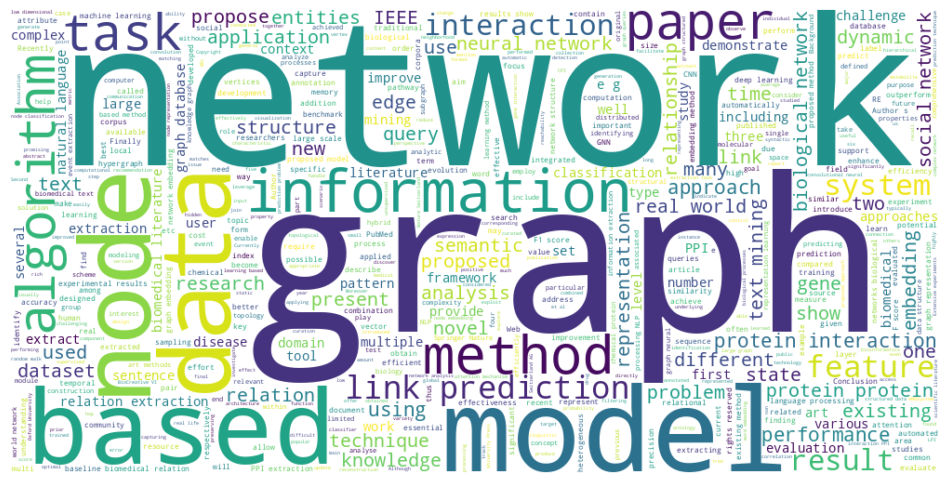

In [191]:
# Create wordcloud from Corpus
create_wordcloud_from_corpus(doc_info_s_pertinent.Abstract.to_list(), dpi=500, save = True, output_path=data_path+'wordcloud_corpus.png')

### Topic Word score (c-TF-IDF)

In [192]:
# show the selected terms for a few topics by creating bar charts out of the c-TF-IDF scores.
topic_model.visualize_barchart(n_words = 20, 
                               topics = pertinent_topics,
                               #top_n_topics=len(topic_info)//4,
                              )  

### Term Score Decline 

In [177]:
# Term Score Decline 
# [TF-IDF — Term Frequency-Inverse Document] #https://www.capitalone.com/tech/machine-learning/understanding-tf-idf/

# Each topic is represented by a set of words. These words, however, do not all equally represent the topic.
# This visualization shows how many words are needed to represent a topic and at which point the beneficial effect of adding words starts to decline.

# https://maartengr.github.io/BERTopic/getting_started/ctfidf/ctfidf.html
topic_model.visualize_term_rank()#(log_scale=True)

## Topic Over Time

In [193]:
import re
df_scopus['DOI'] = df_scopus['DOI'].fillna('missing')
df_scopus['Year'] = df_scopus['Year'].fillna('0000')

df_crop = df_scopus[['DOI','Year']]#.drop_duplicates()
dates = df_crop['Year'].to_list()
years = dates#[date.split(' ')[0].split("-")[0] for date in dates]
len(years)

1818

In [194]:
datetime_formats = ['%Y %b',"%Y"]
#topics, probs = topic_model_t.fit_transform(docs_processed,embeddings)
topics_over_time = topic_model.topics_over_time(docs_raw, 
                                                years, 
                                                datetime_format= datetime_formats[1],
                                                global_tuning=True, 
                                                evolution_tuning=True)
topics_over_time

,Topic,Words,Frequency,Timestamp
0,-1,"2014, cooperative, Ras, literature, COPD",60,2014
1,0,"structural, residues, binding, 3did, FIXa",18,2014
2,1,"POAG, specifi, prioritization, RDF, city",10,2014
3,2,"metabolic, ReVeaLD, ShrimpGPAT, rhamnolipid, B...",21,2014
4,3,"SUMO, CEPPK, complexes, P3DB, GPS",13,2014
...,...,...,...,...
289,20,"hypergraphs, LP, Area, conversion, integrity",1,2024
290,21,"SMILES, CONSMI, AraPathogen2, noses, shark",4,2024
291,25,"Progeni, addiction, repurposing, DrugBank, drug",2,2024
292,27,"neo4jsbml, Markup, GIN, Biology, Language",2,2024


In [195]:
#topic_model_t.visualize_topics_over_time(topics_over_time[topics_over_time["Timestamp"]<2023],top_n_topics=10,width=1250,height=450).show()
#topic_model_t.visualize_topics_over_time(topics_over_time[topics_over_time["Timestamp"]<2023],top_n_topics=10,custom_labels = True, title = "<b>Topics over Time</b>", width=1400,height=800).show()

topic_model.visualize_topics_over_time(topics_over_time,
                                         top_n_topics=10,
                                         custom_labels = True,
                                         topics = pertinent_topics,
                                         normalize_frequency = False,
                                         title = "<b>Topics over Time</b>", 
                                         width=1400,
                                         height=800).show()

# 8. Extras

## Semantic Search

###  1. Simple search

In [52]:
"""
This is a simple application for sentence embeddings: semantic search

We have a corpus with various sentences. Then, for a given query sentence,
we want to find the most similar sentence in this corpus.

This script outputs for various queries the top 5 most similar sentences in the corpus.
"""

from sentence_transformers import SentenceTransformer, util
import torch

embedder = SentenceTransformer("all-MiniLM-L6-v2")

# Corpus with example sentences
corpus = [
    "A man is eating food.",
    "A man is eating a piece of bread.",
    "The girl is carrying a baby.",
    "A man is riding a horse.",
    "A woman is playing violin.",
    "Two men pushed carts through the woods.",
    "A man is riding a white horse on an enclosed ground.",
    "A monkey is playing drums.",
    "A cheetah is running behind its prey.",
]
corpus_embeddings = embedder.encode(corpus, convert_to_tensor=True)

In [55]:
# Query sentences:
queries = [
    "A man is eating pasta.",
    "Someone in a gorilla costume is playing a set of drums.",
    "A cheetah chases prey on across a field.",
]

# Find the closest 5 sentences of the corpus for each query sentence based on cosine similarity
top_k = min(5, len(corpus))

for query in queries:
    query_embedding = embedder.encode(query, convert_to_tensor=True)

    # We use cosine-similarity and torch.topk to find the highest 5 scores
    cos_scores = util.cos_sim(query_embedding, corpus_embeddings)[0]
    top_results = torch.topk(cos_scores, k=top_k)

    print("\n\n======================\n\n")
    print("Query:", query)
    print("\nTop 5 most similar sentences in corpus:")

    for score, idx in zip(top_results[0], top_results[1]):
        print(corpus[idx], "(Score: {:.4f})".format(score))

    """
    # Alternatively, we can also use util.semantic_search to perform cosine similarty + topk
    hits = util.semantic_search(query_embedding, corpus_embeddings, top_k=5)
    hits = hits[0]      #Get the hits for the first query
    for hit in hits:
        print(corpus[hit['corpus_id']], "(Score: {:.4f})".format(hit['score']))
    """

5

### 2. Scientific literature serach

In [6]:
"""
This example demonstrates how we can perform semantic search for scientific publications.

As model, we use SPECTER (https://github.com/allenai/specter), which encodes paper titles and abstracts into a vector space.

When can then use util.semantic_search() to find the most similar papers.

Colab example: https://colab.research.google.com/drive/12hfBveGHRsxhPIUMmJYrll2lFU4fOX06

# https://github.com/UKPLab/sentence-transformers/tree/master/examples/applications/semantic-search
"""

import json
import os
from sentence_transformers import SentenceTransformer, util

# First, we load the papers dataset (with title and abstract information)
dataset_file = "emnlp2016-2018.json"

if not os.path.exists(dataset_file):
    util.http_get("https://sbert.net/datasets/emnlp2016-2018.json", dataset_file)

with open(dataset_file) as fIn:
    papers = json.load(fIn)

print(len(papers), "papers loaded")
papers

974 papers loaded


[{'title': 'Rule Extraction for Tree-to-Tree Transducers by Cost Minimization',
  'abstract': 'Finite-state transducers give efficient representations of many Natural Language phenomena. They allow to account for complex lexicon restrictions encountered, without involving the use of a large set of complex rules difficult to analyze. We here show that these representations can be made very compact, indicate how to perform the corresponding minimization, and point out interesting linguistic side-effects of this operation.',
  'url': 'http://aclweb.org/anthology/D16-1002',
  'venue': 'EMNLP',
  'year': '2016'},
 {'title': 'A Neural Network for Coordination Boundary Prediction',
  'abstract': 'We propose a neural-network based model for coordination boundary prediction. The network is designed to incorporate two signals: the similarity between conjuncts and the observation that replacing the whole coordination phrase with a conjunct tends to produce a coherent sentences. The modeling makes

In [4]:
import json
import os
from sentence_transformers import SentenceTransformer, util
# We then load the allenai-specter model with SentenceTransformers
model = SentenceTransformer("allenai-specter")

# To encode the papers, we must combine the title and the abstracts to a single string
paper_texts = [paper["title"] + "[SEP]" + paper["abstract"] for paper in papers]

# Compute embeddings for all papers
corpus_embeddings = model.encode(paper_texts, convert_to_tensor=True)
# We define a function, given title & abstract, searches our corpus for relevant (similar) papers


def search_papers(title, abstract):
    query_embedding = model.encode(title + "[SEP]" + abstract, convert_to_tensor=True)

    search_hits = util.semantic_search(query_embedding, corpus_embeddings)
    search_hits = search_hits[0]  # Get the hits for the first query

    print("\n\nPaper:", title)
    print("Most similar papers:")
    for hit in search_hits:
        related_paper = papers[hit["corpus_id"]]
        print(
            "{:.2f}\t{}\t{} {}".format(
                hit["score"], related_paper["title"], related_paper["venue"], related_paper["year"]
            )
        )

C:\Users\Utente\anaconda3\envs\torchic\Lib\site-packages\torch\_utils.py:831: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()



In [8]:
# This paper was the EMNLP 2019 Best Paper
search_papers(
    title="Specializing Word Embeddings (for Parsing) by Information Bottleneck",
    abstract="Pre-trained word embeddings like ELMo and BERT contain rich syntactic and semantic information, resulting in state-of-the-art performance on various tasks. We propose a very fast variational information bottleneck (VIB) method to nonlinearly compress these embeddings, keeping only the information that helps a discriminative parser. We compress each word embedding to either a discrete tag or a continuous vector. In the discrete version, our automatically compressed tags form an alternative tag set: we show experimentally that our tags capture most of the information in traditional POS tag annotations, but our tag sequences can be parsed more accurately at the same level of tag granularity. In the continuous version, we show experimentally that moderately compressing the word embeddings by our method yields a more accurate parser in 8 of 9 languages, unlike simple dimensionality reduction.",
)



Paper: Specializing Word Embeddings (for Parsing) by Information Bottleneck
Most similar papers:
0.75	Joint Multilingual Supervision for Cross-lingual Entity Linking	EMNLP 2018
0.70	Macro Grammars and Holistic Triggering for Efficient Semantic Parsing	EMNLP 2017


IndexError: list index out of range

In [ ]:
# This paper was the EMNLP 2020 Best Paper
search_papers(
    title="Digital Voicing of Silent Speech",
    abstract="In this paper, we consider the task of digitally voicing silent speech, where silently mouthed words are converted to audible speech based on electromyography (EMG) sensor measurements that capture muscle impulses. While prior work has focused on training speech synthesis models from EMG collected during vocalized speech, we are the first to train from EMG collected during silently articulated speech. We introduce a method of training on silent EMG by transferring audio targets from vocalized to silent signals. Our method greatly improves intelligibility of audio generated from silent EMG compared to a baseline that only trains with vocalized data, decreasing transcription word error rate from 64% to 4% in one data condition and 88% to 68% in another. To spur further development on this task, we share our new dataset of silent and vocalized facial EMG measurements.",
)

In [ ]:
# This paper was a EMNLP 2020 Honourable Mention Papers
search_papers(
    title="If beam search is the answer, what was the question?",
    abstract="Quite surprisingly, exact maximum a posteriori (MAP) decoding of neural language generators frequently leads to low-quality results. Rather, most state-of-the-art results on language generation tasks are attained using beam search despite its overwhelmingly high search error rate. This implies that the MAP objective alone does not express the properties we desire in text, which merits the question: if beam search is the answer, what was the question? We frame beam search as the exact solution to a different decoding objective in order to gain insights into why high probability under a model alone may not indicate adequacy. We find that beam search enforces uniform information density in text, a property motivated by cognitive science. We suggest a set of decoding objectives that explicitly enforce this property and find that exact decoding with these objectives alleviates the problems encountered when decoding poorly calibrated language generation models. Additionally, we analyze the text produced using various decoding strategies and see that, in our neural machine translation experiments, the extent to which this property is adhered to strongly correlates with BLEU.",
)

### 3. Scopus dataset Search

In [49]:
%%time
import os
from sentence_transformers import SentenceTransformer, util
# We then load the allenai-specter model with SentenceTransformers
model = SentenceTransformer("allenai-specter")

# Compute embeddings for all papers
corpus_embeddings = model.encode(docs_raw[:100], convert_to_tensor=True)

def search_papers(doc):
    query_embedding = model.encode(doc, convert_to_tensor=True)

    search_hits = util.semantic_search(query_embedding, corpus_embeddings)
    search_hits = search_hits[0]  # Get the hits for the first query

    print("Most similar papers:")
    for hit in search_hits:
        related_paper = docs[hit["corpus_id"]]
        print(related_paper)
        print(hit)

#search_papers(docs_raw[0])

CPU times: total: 7.7 s
Wall time: 8.24 s


In [51]:
query_embedding = model.encode('cell, genome, biology, genetics , omics', convert_to_tensor=True)
sim = util.cos_sim(query_embedding, corpus_embeddings)
sim.cpu().numpy().T

array([[0.8392987 ],
       [0.8279138 ],
       [0.81800026],
       [0.6183925 ],
       [0.75433195],
       [0.6667073 ],
       [0.7029813 ],
       [0.76878595],
       [0.7580246 ],
       [0.7457979 ],
       [0.78825134],
       [0.8260262 ],
       [0.7240576 ],
       [0.7961764 ],
       [0.7396349 ],
       [0.7329474 ],
       [0.79344577],
       [0.8319962 ],
       [0.8122388 ],
       [0.70689434],
       [0.5818487 ],
       [0.88208354],
       [0.72640866],
       [0.7104734 ],
       [0.64244926],
       [0.6429493 ],
       [0.69053257],
       [0.7386021 ],
       [0.83125746],
       [0.6599811 ],
       [0.63014257],
       [0.7022218 ],
       [0.80696374],
       [0.80842614],
       [0.66631794],
       [0.77833766],
       [0.7995388 ],
       [0.75044346],
       [0.8069825 ],
       [0.6605993 ],
       [0.82632345],
       [0.7078253 ],
       [0.6938507 ],
       [0.7904164 ],
       [0.7079094 ],
       [0.81015724],
       [0.62032884],
       [0.780

In [48]:
%%time
corpus_embeddings = model.encode(docs_raw[:100])
query_embedding = model.encode('cell, genome, biology, genetics , omics')
sim = util.cos_sim(query_embedding, corpus_embeddings[:10])
sim.numpy()

CPU times: total: 7.11 s
Wall time: 7.88 s


In [42]:
len(sim)
sim.cpu().numpy()

array([[0.8392987 , 0.8279138 , 0.81800026, 0.6183925 , 0.75433195,
        0.6667073 , 0.7029813 , 0.76878595, 0.75802445, 0.7457979 ]],
      dtype=float32)

## Clustering

In [24]:
"""
This is a simple application for sentence embeddings: clustering

Sentences are mapped to sentence embeddings and then k-mean clustering is applied.
"""

from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans

embedder = SentenceTransformer("all-MiniLM-L6-v2")

# Corpus with example sentences
corpus = [
    "A man is eating food.",
    "A man is eating a piece of bread.",
    "A man is eating pasta.",
    "The girl is carrying a baby.",
    "The baby is carried by the woman",
    "A man is riding a horse.",
    "A man is riding a white horse on an enclosed ground.",
    "A monkey is playing drums.",
    "Someone in a gorilla costume is playing a set of drums.",
    "A cheetah is running behind its prey.",
    "A cheetah chases prey on across a field.",
]
corpus_embeddings = embedder.encode(corpus)

In [25]:
# Perform kmean clustering
num_clusters = 5
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_

clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(corpus[sentence_id])

for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i + 1)
    print(cluster)
    print("")

C:\Users\Utente\anaconda3\envs\torchic\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Cluster  1
['The girl is carrying a baby.', 'The baby is carried by the woman']

Cluster  2
['A man is eating food.', 'A man is eating a piece of bread.', 'A man is eating pasta.']

Cluster  3
['A cheetah is running behind its prey.', 'A cheetah chases prey on across a field.']

Cluster  4
['A monkey is playing drums.', 'Someone in a gorilla costume is playing a set of drums.']

Cluster  5
['A man is riding a horse.', 'A man is riding a white horse on an enclosed ground.']


## Reduce Dimensionality

In [ ]:
%%time
import umap
embedding = umap.UMAP(n_components=2,
                      metric='hellinger').fit(embeddings)

## Instructor Models

INSTRUCTOR models
Some INSTRUCTOR models, such as hkunlp/instructor-large, are natively supported in Sentence Transformers. These models are special, as they are trained with instructions in mind. Notably, the primary difference between normal Sentence Transformer models and Instructor models is that the latter do not include the instructions themselves in the pooling step.

In [2]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer("hkunlp/instructor-large")
embeddings = model.encode(
    [
        "Dynamical Scalar Degree of Freedom in Horava-Lifshitz Gravity",
        "Comparison of Atmospheric Neutrino Flux Calculations at Low Energies",
        "Fermion Bags in the Massive Gross-Neveu Model",
        "QCD corrections to Associated t-tbar-H production at the Tevatron",
    ],
    prompt="Represent the Medicine sentence for clustering: ",
)
print(embeddings.shape)

##!!!!!!!!!!! INSTRUCTOR is indeed only compatible with Sentence Transformers 2.2.2, as it overrides some behind-the-scenes functionality that was updated in Sentence Transformers 2.3.0. Perhaps in the future I can try and support INSTRUCTOR models in Sentence Transformers directly.

TypeError: SentenceTransformer.encode() got an unexpected keyword argument 'prompt'

For example, for information retrieval:

In [ ]:
from sentence_transformers import SentenceTransformer
from sentence_transformers.util import cos_sim

model = SentenceTransformer("hkunlp/instructor-base")
query = "where is the food stored in a yam plant"
query_instruction = (
    "Represent the Wikipedia question for retrieving supporting documents: "
)
corpus = [
    'Yams are perennial herbaceous vines native to Africa, Asia, and the Americas and cultivated for the consumption of their starchy tubers in many temperate and tropical regions. The tubers themselves, also called "yams", come in a variety of forms owing to numerous cultivars and related species.',
    "The disparate impact theory is especially controversial under the Fair Housing Act because the Act regulates many activities relating to housing, insurance, and mortgage loansâ€”and some scholars have argued that the theory's use under the Fair Housing Act, combined with extensions of the Community Reinvestment Act, contributed to rise of sub-prime lending and the crash of the U.S. housing market and ensuing global economic recession",
    "Disparate impact in United States labor law refers to practices in employment, housing, and other areas that adversely affect one group of people of a protected characteristic more than another, even though rules applied by employers or landlords are formally neutral. Although the protected classes vary by statute, most federal civil rights laws protect based on race, color, religion, national origin, and sex as protected traits, and some laws include disability status and other traits as well.",
]
corpus_instruction = "Represent the Wikipedia document for retrieval: "

query_embedding = model.encode(query, prompt=query_instruction)
corpus_embeddings = model.encode(corpus, prompt=corpus_instruction)
similarities = cos_sim(query_embedding, corpus_embeddings)
print(similarities)

##!!!!!!!!!!! INSTRUCTOR is indeed only compatible with Sentence Transformers 2.2.2, as it overrides some behind-the-scenes functionality that was updated in Sentence Transformers 2.3.0. Perhaps in the future I can try and support INSTRUCTOR models in Sentence Transformers directly.

## Accessory functions

In [ ]:
# Prepare data
umap_data = UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
result = pd.DataFrame(umap_data, columns=['x', 'y'])
result['labels'] = cluster.labels_

# Visualize clusters
fig, ax = plt.subplots(figsize=(20, 10))
outliers = result.loc[result.labels == -1, :]
clustered = result.loc[result.labels != -1, :]
plt.scatter(outliers.x, outliers.y, color='#BDBDBD', s=0.05)
plt.scatter(clustered.x, clustered.y, c=clustered.labels, s=0.05, cmap='hsv_r')
plt.colorbar()

### optimize labels

In [ ]:
from transformers import pipeline
classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli") #base_embedder

# A selected topic representation
# 'god jesus atheists atheism belief atheist believe exist beliefs existence'
sequence_to_classify =  " ".join([word for word, _ in topic_model.get_topic(1)])

# Our set of potential topic labels
candidate_labels = ['brain', 'liver', 'cancer']

classifier(sequence_to_classify, candidate_labels)

#{'labels': ['cooking', 'dancing', 'religion'],
# 'scores': [0.086, 0.063, 0.850],
# 'sequence': 'god jesus atheists atheism belief atheist believe exist beliefs existence'}

## TF-IDF calculation 
example 1

In [128]:
# TfidfVectorizer 
# CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
import pandas as pd

# set of documents
train = ['The sky is blue.','The sun is bright.']
test = ['The sun in the sky is bright', 'We can see the shining sun, the bright sun.']

# instantiate the vectorizer object
countvectorizer = CountVectorizer(analyzer= 'word', stop_words='english')
tfidfvectorizer = TfidfVectorizer(analyzer='word',stop_words= 'english')

# convert th documents into a matrix
count_wm = countvectorizer.fit_transform(train)
tfidf_wm = tfidfvectorizer.fit_transform(train)

#retrieve the terms found in the corpora
# if we take same parameters on both Classes(CountVectorizer and TfidfVectorizer) , it will give same output of get_feature_names() methods)
#count_tokens = tfidfvectorizer.get_feature_names() # no difference
count_tokens = countvectorizer.get_feature_names_out()
tfidf_tokens = tfidfvectorizer.get_feature_names_out()

df_countvect = pd.DataFrame(data = count_wm.toarray(),index = ['Doc1','Doc2'],columns = count_tokens)
df_tfidfvect = pd.DataFrame(data = tfidf_wm.toarray(),index = ['Doc1','Doc2'],columns = tfidf_tokens)

print("Count Vectorizer\n")
print(df_countvect)
print("\nTD-IDF Vectorizer\n")
print(df_tfidfvect)

Count Vectorizer

      blue  bright  sky  sun
Doc1     1       0    1    0
Doc2     0       1    0    1

TD-IDF Vectorizer

          blue    bright       sky       sun
Doc1  0.707107  0.000000  0.707107  0.000000
Doc2  0.000000  0.707107  0.000000  0.707107


example 2

In [ ]:
from collections import Counter
import math

def calculate_tf(word_list):
    word_freq = Counter(word_list)
    total_words = len(word_list)
    tf_scores = {word: freq/total_words for word, freq in word_freq.items()}
    return tf_scores

def calculate_idf(documents, word):
    num_docs_containing_word = sum(1 for document in documents if word in document)
    total_documents = len(documents)
    idf = math.log10(total_documents / (1 + num_docs_containing_word))
    return idf

def calculate_tfidf(documents):
    unique_words = set(word for document in documents for word in document)
    tfidf_scores = {}
    for word in unique_words:
        tfidf_scores[word] = {doc_index: calculate_tf(document)[word] * calculate_idf(documents, word) for doc_index, document in enumerate(documents) if word in document}
    return tfidf_scores

# Example text
text1 = 'This is the first document.'
text2 = 'This document is the second document.'
text3 = 'And this is the third one.'
text4 = 'Is this the first document?'

documents = [text1.split(), text2.split(), text3.split()]

# Calculate tf-idf scores for the documents
tfidf_scores = calculate_tfidf(documents)

print(tfidf_scores)

## Modules

In [58]:
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan.hdbscan_ import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer

embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

umap_model = UMAP(n_neighbors  = 15,
                  n_components = 5,
                  min_dist     = 0.0,
                  metric       = 'cosine',
                  random_state = 123456  # ensures reproducibility
                  )

hdbscan_model = HDBSCAN(min_cluster_size=10,   #BERTopic(min_topic_size = 10) #default
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=False)

vectorizer_model = CountVectorizer(min_df=10,
                                   ngram_range=(1, 1),
                                   stop_words="english")

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

## Notes

What is the meaning of "fitting" a model in machine learning?

When we talk about "fitting" a model in machine learning, we are essentially referring to the process of training the model on a dataset. By "pretraining" a model, we mean that the model has been initially trained on a large dataset (which may or may not be similar to the dataset you are working with) before being fine-tuned on the specific dataset you are interested in.

Pretraining a model helps in capturing general patterns and features from the initial dataset, which can then be fine-tuned on a smaller, more specific dataset. This process is especially useful when you have limited data for your specific task, as the pretrained model can provide a good starting point that can be adapted to your particular problem.

When you "fit" a pretrained model, you are essentially adjusting the model's parameters to fit the patterns and relationships present in your specific dataset. This fine-tuning process helps the model learn the specific nuances of your data and improve its performance on your particular task. 

In summary, fitting a pretrained model in machine learning involves taking a model that has already been trained on a different dataset and adjusting it to better suit the patterns present in your own data.